In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

pd.set_option('display.max_columns', None)
pd.set_option("max_rows", None)

In [2]:
df = pd.read_csv("ph_clean.csv")

In [3]:
df.head()

,Name,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
0,Lana Rhoades,Lana Rhoades is a Virgo born in September of 1...,14000000,903120820,1,26.0,6.0,0.0,1,0,0,1,24,-,6-Sep-96,"Chicago, Illinois, United States of America",-,to Present,Active,"Los Angeles, US",-,White,-,-,No,-,Female,Brunette,165,52,Guys and Girls,-,3,34D-23-35,Unknown,121140882.0,192086347,Open,Virgo,No,-,-,-,51,-,0.0,1.0,1.0
1,Abella Danger,"Danger might be her last name, but when it com...",868000,862007676,2,3.0,0.0,0.0,1,0,1,1,19,-,1-Jan-01,"Miami, Florida, United States of America",-,to Present,Active,"Los Angeles, US",-,White,-,-,No,-,Female,Brunette,163,59,Guys and Girls,-,1,32C-24-32,Unknown,71825882.0,102153809,Single,Scorpio,No,-,-,-,17,-,0.0,2.0,1.0
2,Riley Reid,American pornstar Riley Reid was born in May o...,15000000,1074883174,3,157.0,4.0,0.0,1,0,0,1,29,-,9-Jul-91,"Loxahatchee, Florida, United States of America",-,2011 to Present,Active,"Los Angeles, US",-,White,-,-,No,-,Female,Blonde|Brunette,163,49,Guys and Girls,-,4,32A-25-36,Unknown,128389976.0,111081874,Single,Cancer,Yes,-,-,-,111,-,0.0,3.0,1.0
3,Eva Elfie,Hey! I'm a young Siberian girl and I want to p...,12000000,466905043,4,22.0,20.0,0.0,1,0,1,0,20,Russian,27-May-00,Russia,-,2018 to Present,Active,"Moscow, RU",-,White,Green,-,No,-,Female,Grey,163,45,Guys and Girls,"Most of all I like playing computer games, but...",2,34C-24-35,No,16892342.0,91253351,Single,Gemini,No,-,"Smart people, shy boys and girls kisses.",-,226,-,0.0,4.0,1.0
4,Mia Malkova,Some girls are so damn hot that they can get y...,11000000,623234336,5,90.0,11.0,0.0,1,0,0,1,28,-,1-Jul-92,"Palm Springs, California, United States of Ame...",-,2012 to Present,Active,"Portland, US",-,White,-,-,No,-,Female,Blonde,173,54,Guys and Girls,"Masturbating! Seriously, I have a problem! I l...",2,33C-21-40,No,90190178.0,73577523,Open,Gemini,No,"Cocky, Disrespectful, Unhygienic, Immature, Ye...","Sense of Humor, Great Smile, English Accents, ...",-,779,-,0.0,5.0,1.0


In [4]:
df.set_index('Name',inplace=True)

In [5]:
df["Fake Boobs"] = df["Fake Boobs"].apply(lambda x: 1 if x == "Yes" else 0)

In [6]:
df["Career Status"] = df["Career Status"].apply(lambda x: 1 if x == "Active" else 0)

In [7]:
df["Hair Color"] = df["Hair Color"].str.replace("-", "Various")

In [8]:
pornstars = df[df['Model_rank'] == 0]

In [9]:
pornstars.shape

(17538, 47)

In [10]:
pornstars.head()

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Lana Rhoades,Lana Rhoades is a Virgo born in September of 1...,14000000,903120820,1,26.0,6.0,0.0,1,0,0,1,24,-,6-Sep-96,"Chicago, Illinois, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,165,52,Guys and Girls,-,3,34D-23-35,Unknown,121140882.0,192086347,Open,Virgo,No,-,-,-,51,-,0.0,1.0,1.0
Abella Danger,"Danger might be her last name, but when it com...",868000,862007676,2,3.0,0.0,0.0,1,0,1,1,19,-,1-Jan-01,"Miami, Florida, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,163,59,Guys and Girls,-,1,32C-24-32,Unknown,71825882.0,102153809,Single,Scorpio,No,-,-,-,17,-,0.0,2.0,1.0
Riley Reid,American pornstar Riley Reid was born in May o...,15000000,1074883174,3,157.0,4.0,0.0,1,0,0,1,29,-,9-Jul-91,"Loxahatchee, Florida, United States of America",-,2011 to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Blonde|Brunette,163,49,Guys and Girls,-,4,32A-25-36,Unknown,128389976.0,111081874,Single,Cancer,Yes,-,-,-,111,-,0.0,3.0,1.0
Eva Elfie,Hey! I'm a young Siberian girl and I want to p...,12000000,466905043,4,22.0,20.0,0.0,1,0,1,0,20,Russian,27-May-00,Russia,-,2018 to Present,1,"Moscow, RU",-,White,Green,-,0,-,Female,Grey,163,45,Guys and Girls,"Most of all I like playing computer games, but...",2,34C-24-35,No,16892342.0,91253351,Single,Gemini,No,-,"Smart people, shy boys and girls kisses.",-,226,-,0.0,4.0,1.0
Mia Malkova,Some girls are so damn hot that they can get y...,11000000,623234336,5,90.0,11.0,0.0,1,0,0,1,28,-,1-Jul-92,"Palm Springs, California, United States of Ame...",-,2012 to Present,1,"Portland, US",-,White,-,-,0,-,Female,Blonde,173,54,Guys and Girls,"Masturbating! Seriously, I have a problem! I l...",2,33C-21-40,No,90190178.0,73577523,Open,Gemini,No,"Cocky, Disrespectful, Unhygienic, Immature, Ye...","Sense of Humor, Great Smile, English Accents, ...",-,779,-,0.0,5.0,1.0


In [11]:
models = df[df['Model_rank'] > 0]

In [12]:
models.shape

(81610, 47)

In [13]:
models.head()

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Mini Diva,Hey there! You can call me Mini Diva. I love s...,820000,364041175,11,65.0,7.0,107.0,0,1,1,0,26,-,6-Aug-94,Czech Republic,-,-,0,"Heaven, Europe",-,White,-,-,0,-,Female,Brunette,167,50,Guys and Girls,Boring AF.,2,35-25-36,Yes,0.0,59460751,Single,Irrelevant,No,Dunno what can turn me off.,"When you watching me, fucking love it!","364,041,175",1057,Prague,1.0,0.0,0.0
yinyleon,We will try to bring you the best fuck that we...,586000,510938330,21,140.0,1.0,0.0,0,1,1,0,36,-,1-Jun-84,-,-,-,0,"United states, United States",-,-,-,-,0,-,Couple,Other,0,0,Guys and Girls,"I love to go to the gym, running, hiking, fuck...",1,-,Unknown,0.0,67129229,Taken,Irrelevant,No,-,My biggest turn on is when I get my ass and pu...,"510,938,330",1422,-,2.0,0.0,0.0
Crystal Lust,Cum see more of me on Onlyfans.com/LustCrystal...,433000,346726146,29,104.0,69.0,173.0,0,1,1,0,24,-,7-Oct-96,-,-,-,0,"Miami, United States",-,-,-,-,0,-,Female,Brunette,157,0,Guys and Girls,-,1,42-32-50,Unknown,0.0,50243658,Taken,Irrelevant,No,-,Getting fucked in the ass Onlyfans.com/LustCry...,"346,726,146",560,-,4.0,0.0,0.0
Solazola,"Hi, guys) We hope that you LOVE SEX as much as...",748000,234093027,32,50.0,14.0,181.0,0,1,0,0,21,-,12-Dec-99,-,-,-,0,"Tallinn, Estonia",-,White,-,-,0,-,Couple,Brunette,172,50,Guys and Girls,"Sport, snowboarding, movies, fashion, food, pl...",2,34-24-36,No,0.0,56041576,Taken,Irrelevant,Yes,-,blowjobs (love this action),"234,093,027",1059,-,5.0,0.0,0.0
Reislin,Hey honey! Is your cock not still hard? Trust ...,1000000,583379162,42,44.0,67.0,78.0,0,1,1,0,20,-,22-Dec-99,-,-,-,0,"RÄ«ga, Latvia",-,White,-,-,0,-,Female,Brunette,162,49,Guys and Girls,"Photography, travel, World of Warcraft, blowjo...",2,-,Yes,0.0,54400775,Taken,Irrelevant,Yes,-,When you watching me :),"583,379,162",2272,-,6.0,0.0,0.0


In [14]:
pornstars['Gender'].value_counts()

-              14672
Female          2018
Male             552
Trans Woman      144
Couple           131
Other             13
Trans Man          3
Non-Binary         3
Company            1
None               1
Name: Gender, dtype: int64

In [15]:
pornstars['Endowment'].value_counts()

-           17323
7-9"          123
5-7"           44
9-10"          28
10"+           15
3-5"            4
Under 3"        1
Name: Endowment, dtype: int64

In [16]:
models['Gender'].value_counts()

Female         39193
Male           22850
Couple         16872
Trans Woman     1424
Other            652
Trans Man        384
Non-Binary       224
Group              4
Company            4
None               3
Name: Gender, dtype: int64

In [17]:
models['Endowment'].value_counts()

-           75108
7-9"         3060
5-7"         2011
9-10"         705
10"+          410
3-5"          216
Under 3"      100
Name: Endowment, dtype: int64

In [18]:
p_men = pornstars[pornstars['Gender'] == "Male"]
p_men.head()

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Jordi El Nino Polla,Jordi El Nino Polla is a guy who has the luck ...,254000,453739288,12,39.0,0.0,0.0,1,0,0,1,26,-,11-Sep-94,Spain,-,to Present,1,"Ciudad Real, ES",-,White,-,-,0,-,Male,Brunette,173,75,Girls,Big titties-,5,--,Unknown,51618164.0,78938285,Taken,Virgo,No,-,Big titties,-,275,-,0.0,13.0,1.0
Alex Adams,"Hi I'm Alex, I love making cool role play vide...",690000,1922584856,19,337.0,0.0,0.0,1,0,1,0,33,-,14-Aug-87,-,-,to Present,1,-,-,White,-,-,0,-,Male,Brunette,178,83,Girls,-,3,--,Unknown,56317364.0,90839410,Single,Irrelevant,No,-,-,-,964,-,0.0,16.0,1.0
Owen Gray,-,262000,395909860,49,189.0,93.0,0.0,1,0,1,0,35,-,3-May-85,"San Francisco, California, United States of Am...",-,2012 to Present,1,"San Francisco, US",-,White,Green,-,0,-,Male,Brunette,183,70,Girls,-,3,--,No,14648376.0,23996269,Open,Pisces,Yes,-,-,-,4585,-,0.0,41.0,1.0
James Deen,"Once upon a time, the idea of the male porn st...",172000,914992767,67,194.0,58.0,0.0,1,0,0,0,34,American,7-Feb-86,"Pasadena, California, United States of America",-,2004 to Present,1,"The internet, US","7-9""",White,Blue,Yes,0,Cut,Male,Brunette,173,69,Girls,burritos-,4,--,No,23786398.0,14530827,Taken,Aquarius,No,you don't really know who i am do you?,ummmm.... everything,-,509,-,0.0,59.0,1.0
Ricky Johnson,"Multiethnic pornstar Ricky Johnson is Black, C...",130000,337461498,119,53.0,0.0,0.0,1,0,0,0,28,American,29-Jan-92,"Inglewood city, Los Angeles, United States of ...",-,2016 to Present,1,"Los Angeles, US","10""+",Black,Hazel,No,0,Uncut,Male,Black,185,83,Girls,"Watching really good tv shows , playing super ...",2,--,Yes,11563371.0,14656665,Single,Aquarius,No,Personality,Personality,-,180,-,0.0,94.0,1.0


In [19]:
p_women = pornstars[(pornstars['Gender'] == "-") | (pornstars['Gender'] == "Female") | (pornstars['Gender'] == "Other")]
p_women.head(10)

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Lana Rhoades,Lana Rhoades is a Virgo born in September of 1...,14000000,903120820,1,26.0,6.0,0.0,1,0,0,1,24,-,6-Sep-96,"Chicago, Illinois, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,165,52,Guys and Girls,-,3,34D-23-35,Unknown,121140882.0,192086347,Open,Virgo,No,-,-,-,51,-,0.0,1.0,1.0
Abella Danger,"Danger might be her last name, but when it com...",868000,862007676,2,3.0,0.0,0.0,1,0,1,1,19,-,1-Jan-01,"Miami, Florida, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,163,59,Guys and Girls,-,1,32C-24-32,Unknown,71825882.0,102153809,Single,Scorpio,No,-,-,-,17,-,0.0,2.0,1.0
Riley Reid,American pornstar Riley Reid was born in May o...,15000000,1074883174,3,157.0,4.0,0.0,1,0,0,1,29,-,9-Jul-91,"Loxahatchee, Florida, United States of America",-,2011 to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Blonde|Brunette,163,49,Guys and Girls,-,4,32A-25-36,Unknown,128389976.0,111081874,Single,Cancer,Yes,-,-,-,111,-,0.0,3.0,1.0
Eva Elfie,Hey! I'm a young Siberian girl and I want to p...,12000000,466905043,4,22.0,20.0,0.0,1,0,1,0,20,Russian,27-May-00,Russia,-,2018 to Present,1,"Moscow, RU",-,White,Green,-,0,-,Female,Grey,163,45,Guys and Girls,"Most of all I like playing computer games, but...",2,34C-24-35,No,16892342.0,91253351,Single,Gemini,No,-,"Smart people, shy boys and girls kisses.",-,226,-,0.0,4.0,1.0
Mia Malkova,Some girls are so damn hot that they can get y...,11000000,623234336,5,90.0,11.0,0.0,1,0,0,1,28,-,1-Jul-92,"Palm Springs, California, United States of Ame...",-,2012 to Present,1,"Portland, US",-,White,-,-,0,-,Female,Blonde,173,54,Guys and Girls,"Masturbating! Seriously, I have a problem! I l...",2,33C-21-40,No,90190178.0,73577523,Open,Gemini,No,"Cocky, Disrespectful, Unhygienic, Immature, Ye...","Sense of Humor, Great Smile, English Accents, ...",-,779,-,0.0,5.0,1.0
Brandi Love,Brandi Love started her porno career at the ag...,626000,595530540,6,101.0,68.0,35.0,1,0,0,1,47,-,29-Mar-73,"Raleigh, North Carolina, United States of America",-,2007 to Present,1,"Wake Forest, US",-,White,-,-,1,-,Female,Blonde,170,57,Guys and Girls,I am an adrenaline junkie and love sports. Fro...,9,36C-25-36,Yes,82587725.0,59004138,Open,Aries,Yes,hateful and judgmental people. I do not like p...,People who exude sexual confidence. I like peo...,-,746,Detroit,0.0,6.0,1.0
Mia Khalifa,"Small in size but not in sex appeal, Mia Khali...",1266004,828972502,7,619.0,0.0,0.0,0,0,0,0,28,-,-,"Beirut, Lebanon",2/10/1993,-,0,-,-,-,-,-,0,-,-,Other,157,55,-,-,0,-,Unknown,0.0,0,-,Irrelevant,No,-,-,-,0,-,0.0,7.0,1.0
Nicole Aniston,Nicole Aniston is a petite blonde California b...,703000,404206009,8,7.0,3.0,0.0,1,0,0,0,33,-,9-Sep-87,"San Diego, California, United States of America",-,2010 to Present,1,"San Diego, US",-,White,-,-,1,-,Female,Blonde,160,61,Guys and Girls,"Plant based food, good music, books, documenta...",2,34D-22-36,Yes,79089277.0,53701806,Single,Virgo,Yes,-,-,-,24,Temecula,0.0,9.0,1.0
Angela White,Have you ever wondered if everything really go...,493000,484914232,9,75.0,87.0,0.0,1,0,0,1,35,Australian,4-Mar-85,"Sydney, New South Wales, Australia",-,2003 to Present,1,"Los Angeles, US",-,White,Blue,-,0,-,Female,Brunette,160,59,Guys and Girls,-,6,40GG-28-38,No,51105364.0,56235420,Single,Pisces,Yes,-,-,-,492,-,0.0,8.0,1.0


In [20]:
from sklearn.model_selection import train_test_split

In [21]:
y = p_men['Pornhub_rank']
X = p_men.drop(columns=['Pornhub_rank', "Model_rank", 'Pornstar_rank' ,'Bio', 'Background', 'Birthday', 'Career Start and End', "Eye Color" ,'Birthplace', "City and Country", "Endowment",'Born', 'Facial Hair', 'Interested in',
       'Interests and hobbies', 'Turn Offs', 'Turn Ons', 'Video Views', 'Hometown', 'Foreskin', 'Pornstar_or_model'], axis=1)
X.head()

,Subscribers,Videos_views,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Career Status,Ethnicity,Fake Boobs,Gender,Hair Color,Height,Weight,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Videos Watched
Name,,,,,,,,,,,,,,,,,,,,,,,,,,
Jordi El Nino Polla,254000,453739288,39.0,0.0,0.0,1,0,0,1,26,1,White,0,Male,Brunette,173,75,5,--,Unknown,51618164.0,78938285,Taken,Virgo,No,275
Alex Adams,690000,1922584856,337.0,0.0,0.0,1,0,1,0,33,1,White,0,Male,Brunette,178,83,3,--,Unknown,56317364.0,90839410,Single,Irrelevant,No,964
Owen Gray,262000,395909860,189.0,93.0,0.0,1,0,1,0,35,1,White,0,Male,Brunette,183,70,3,--,No,14648376.0,23996269,Open,Pisces,Yes,4585
James Deen,172000,914992767,194.0,58.0,0.0,1,0,0,0,34,1,White,0,Male,Brunette,173,69,4,--,No,23786398.0,14530827,Taken,Aquarius,No,509
Ricky Johnson,130000,337461498,53.0,0.0,0.0,1,0,0,0,28,1,Black,0,Male,Black,185,83,2,--,Yes,11563371.0,14656665,Single,Aquarius,No,180


In [22]:
X = pd.get_dummies(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

In [23]:
from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

GradientBoostingRegressor(random_state=0)

In [24]:
reg.predict(X_test)
reg.score(X_test, y_test)

0.6499905129143735

In [25]:
y = p_women['Pornhub_rank']
X = p_women.drop(columns=['Pornhub_rank', "Model_rank", 'Pornstar_rank' ,'Bio', 'Background', 'Birthday', 'Career Start and End', "Eye Color" ,'Birthplace', "City and Country", "Endowment",'Born', 'Facial Hair', 'Interested in',
       'Interests and hobbies', 'Turn Offs', 'Turn Ons', 'Video Views', 'Hometown', 'Foreskin', 'Pornstar_or_model'], axis=1)
X.head()

,Subscribers,Videos_views,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Career Status,Ethnicity,Fake Boobs,Gender,Hair Color,Height,Weight,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Videos Watched
Name,,,,,,,,,,,,,,,,,,,,,,,,,,
Lana Rhoades,14000000,903120820,26.0,6.0,0.0,1,0,0,1,24,1,White,0,Female,Brunette,165,52,3,34D-23-35,Unknown,121140882.0,192086347,Open,Virgo,No,51
Abella Danger,868000,862007676,3.0,0.0,0.0,1,0,1,1,19,1,White,0,Female,Brunette,163,59,1,32C-24-32,Unknown,71825882.0,102153809,Single,Scorpio,No,17
Riley Reid,15000000,1074883174,157.0,4.0,0.0,1,0,0,1,29,1,White,0,Female,Blonde|Brunette,163,49,4,32A-25-36,Unknown,128389976.0,111081874,Single,Cancer,Yes,111
Eva Elfie,12000000,466905043,22.0,20.0,0.0,1,0,1,0,20,1,White,0,Female,Grey,163,45,2,34C-24-35,No,16892342.0,91253351,Single,Gemini,No,226
Mia Malkova,11000000,623234336,90.0,11.0,0.0,1,0,0,1,28,1,White,0,Female,Blonde,173,54,2,33C-21-40,No,90190178.0,73577523,Open,Gemini,No,779


In [26]:
X = pd.get_dummies(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)
reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

GradientBoostingRegressor(random_state=0)

In [27]:
reg.predict(X_test)
reg.score(X_test, y_test)

0.6946409597719247

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import preprocessing
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV, ElasticNet
from xgboost import XGBRegressor, plot_importance 
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
model_list = [LinearRegression(), KNeighborsRegressor(n_neighbors=3, n_jobs=10), KNeighborsRegressor(n_neighbors=5, n_jobs=10), KNeighborsRegressor(n_neighbors=7, n_jobs=10), MLPRegressor(hidden_layer_sizes=(100,), alpha=0.0001, learning_rate_init=0.001, random_state=42), RandomForestRegressor(), RandomForestRegressor(bootstrap= True,  max_depth= 10,  max_features= 'auto', max_samples= 0.5, min_samples_leaf= 2, min_samples_split= 2, n_estimators= 100), GradientBoostingRegressor(random_state=0), XGBRegressor(n_estimators = 1000), XGBRegressor(), XGBRegressor(n_estimators=1000, learning_rate=0.05), XGBRegressor(bootstrap = True,  max_depth= 5, max_features = 'sqrt', max_samples= None, min_samples_leaf=1, min_samples_split= 2, n_estimators= 50)]

In [29]:
columns_to_drop = ['Pornhub_rank', "Model_rank", 'Pornstar_rank' ,'Bio', 'Background', 'Birthday', 'Career Start and End', "Eye Color" ,'Birthplace', "City and Country", "Endowment",'Born', 'Facial Hair', 'Interested in',
       'Interests and hobbies', 'Turn Offs', 'Turn Ons', 'Video Views', 'Hometown', 'Foreskin', 'Pornstar_or_model']

In [30]:
def work_smart(data, target, model_list):
    X = pd.get_dummies(data.drop(columns_to_drop, axis=1))
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train, X_test = (scaler.transform(X_train), scaler.transform(X_test))
    results = {}
    results_mae = {}
    results_mse = {}
    for model in model_list:
        model.fit(X_train, y_train)
        results[model] = model.score(X_test, y_test)
        print(model, 'R2 score:', model.score(X_test, y_test))
        y_pred = model.predict(X_test)
        results2 = mean_absolute_error(y_test, y_pred)
        results3 = mean_squared_error(y_test, y_pred, squared=False)
        print('Mean Absolute Error:', results2)
        print('Mean Squared Error:', results3)
        results_mae[model] = results2
        results_mse[model] = results3
        plt.figure(figsize=(10,8))
        sns.regplot(x=y_pred, y=y_test, line_kws={"color": "orange"})
        plt.xlabel('Actual Values ')
        plt.ylabel('Predictions ')
        plt.title('Linear Model Predictions vs Actual')
        plt.show()
    final_result_r2 = max(results.values())
    final_result_mae = min(results_mae.values())
    final_result_mse = min(results_mse.values())
    print("--------------------------------------------------------------------------------------------------------")
    print('TAA DAAA!! AND THE WINNER IIIISSSSS:')
    print("--------------------------------------------------------------------------------------------------------")
    best_mae_model = min(results_mae, key=results_mae.get)
    best_r2_model = max(results, key=results.get)
    best_mse_model = min(results_mse, key=results_mse.get)
    print('Best R2:', best_r2_model, final_result_r2)
    print('Best Mean Absolute Error:', best_mae_model, final_result_mae)
    print('Best Mean Squared Error:', best_mse_model, final_result_mse)
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_r2_model.predict(X_test), y=y_test, line_kws={"color": "orange"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model R2 Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mae_model.predict(X_test), y=y_test, line_kws={"color": "green"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MAE Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mse_model.predict(X_test), y=y_test, line_kws={"color": "yellow"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MSE Predictions vs Actual')
    plt.show()
    return best_mae_model, best_mse_model, best_r2_model

In [31]:
m_men = models[models['Gender'] == "Male"]
m_men.head()

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
German Scout,"GERMAN SCOUT is the ""Venus Award"" Winner 2019 ...",591000,72502392,310,216.0,250.0,6805.0,0,1,1,0,38,-,22-Jan-82,Germany,-,-,0,"Berlin, Germany","9-10""",White,-,No,0,Uncut,Male,Brunette,0,0,Girls,-,2,-,Yes,0.0,5610502,Single,Irrelevant,Yes,-,-,"72,502,392",3378,Berlin,52.0,0.0,0.0
ComerZZ,"Dear friends, do not forget to please and moti...",306000,59828626,369,61.0,0.0,120.0,0,1,0,0,20,-,1-Jan-00,-,-,-,0,"pornhub, Europe","10""+",Other,-,Yes,0,Uncut,Male,Other,177,50,Girls,-,3,-,No,0.0,10967124,Open,Irrelevant,No,-,-,"59,828,626",3042,-,58.0,0.0,0.0
GentlyPerv,Every month new video only for FAN CLUB member...,343000,48168975,576,34.0,0.0,20.0,0,1,0,0,36,-,14-Jul-84,-,-,-,0,-,-,-,-,-,0,-,Male,Other,0,0,Girls,Always looking for new people for collaboratio...,2,-,Unknown,0.0,5178836,Single,Irrelevant,No,-,-,"48,168,975",2551,-,106.0,0.0,0.0
Fella The Turn Up Monster,I live a life only made for a bachelor and kin...,843000,117623128,599,255.0,0.0,0.0,0,1,0,0,27,-,24-Jan-93,United States of America,-,-,0,"Milwaukee, United States","9-10""",Black,-,Yes,0,-,Male,Black,190,70,Girls,Making music and learning the woman body better,2,-,No,0.0,7478807,Single,Irrelevant,Yes,"Ugly feet, boring sex, quiet sex, and skinny w...","Thick women with big asses, pretty feet, perly...","117,623,128",731,Milwaukee,113.0,0.0,0.0
jerk2porn,The Best Moaning Porn Reaction Videos on PornH...,193000,34254776,627,450.0,0.0,0.0,0,1,0,0,31,-,10-Jan-89,-,-,-,0,"LAS VEGAS, United States","7-9""",Other,-,Yes,0,Cut,Male,Brunette,195,102,Girls,-,3,-,No,0.0,2409018,Open,Irrelevant,Yes,-,-,"34,254,776",2145,Beverly Hills,115.0,0.0,0.0


LinearRegression() R2 score: -2.6236574965091366e+20
Mean Absolute Error: 7518217761968.38
Mean Squared Error: 401820429746768.06


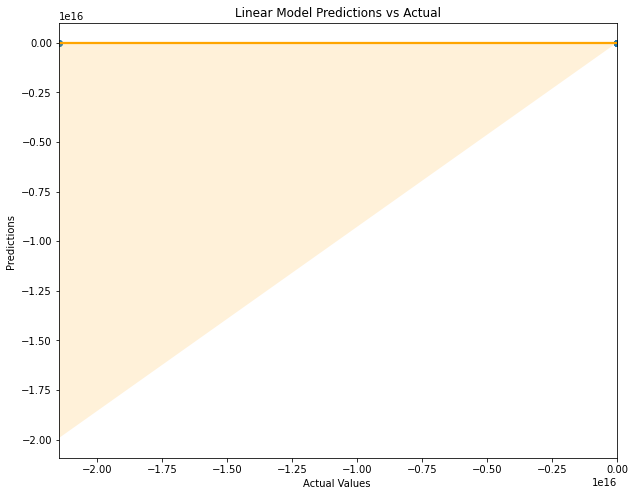

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.05989695444187226
Mean Absolute Error: 19184.48730964467
Mean Squared Error: 24052.82955393188


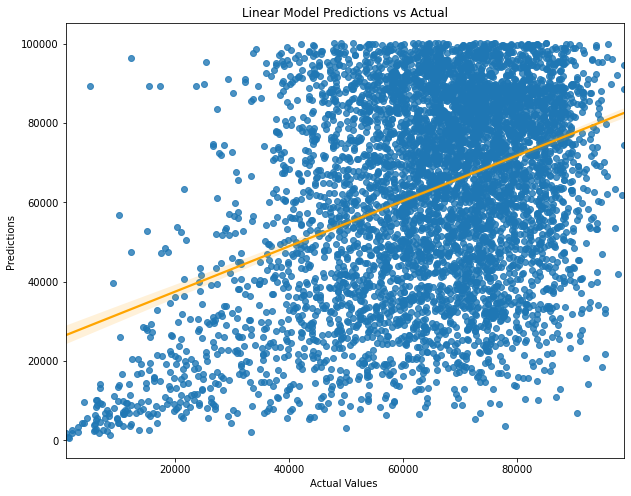

KNeighborsRegressor(n_jobs=10) R2 score: 0.12958193286084074
Mean Absolute Error: 18662.22734115176
Mean Squared Error: 23144.211662501635


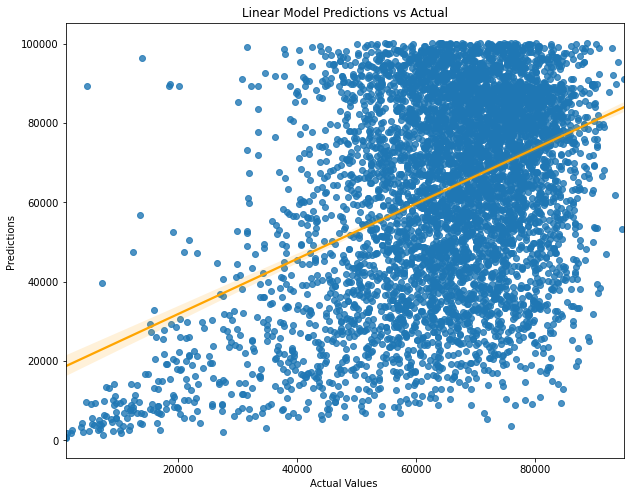

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.16488143944523792
Mean Absolute Error: 18382.086819534394
Mean Squared Error: 22670.051771917733


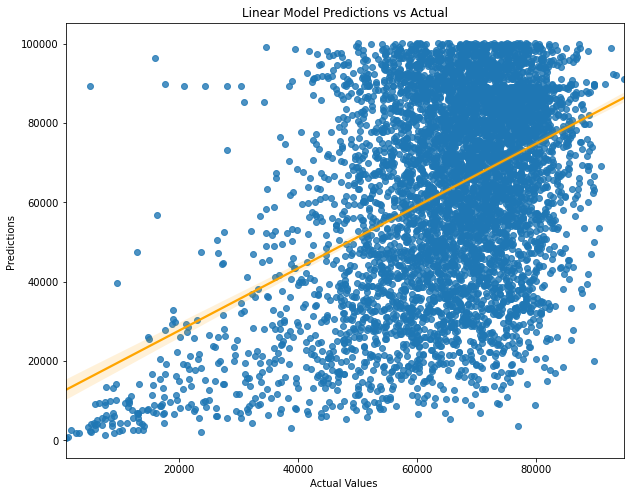

MLPRegressor(random_state=42) R2 score: 0.17417197861332445
Mean Absolute Error: 18406.407214818508
Mean Squared Error: 22543.599035861025


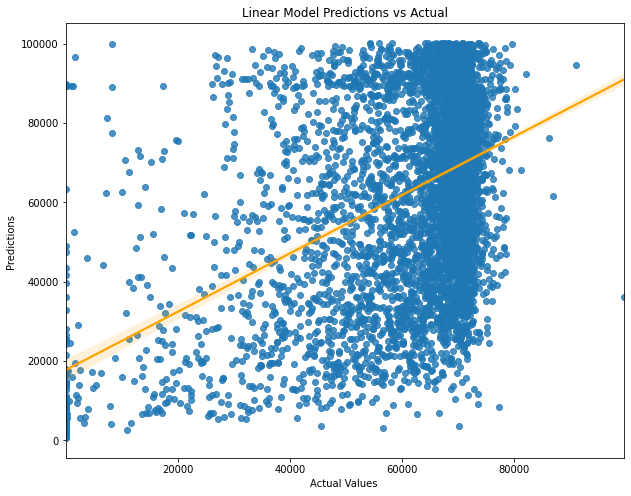

RandomForestRegressor() R2 score: 0.4768966577040422
Mean Absolute Error: 14159.499569403115
Mean Squared Error: 17942.055319722203


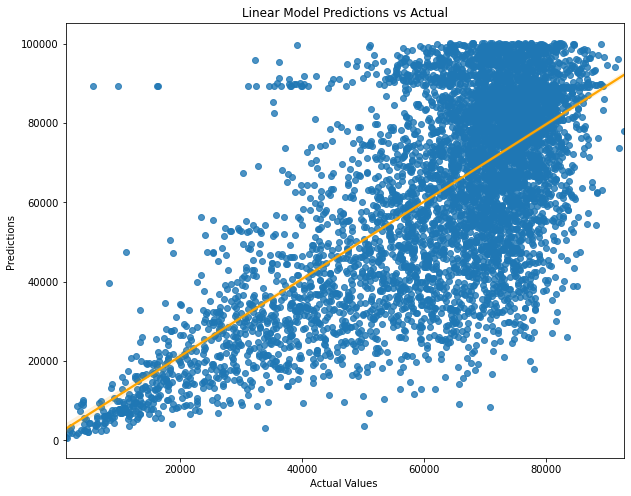

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.49384045650513986
Mean Absolute Error: 13934.793759488488
Mean Squared Error: 17649.083540425177


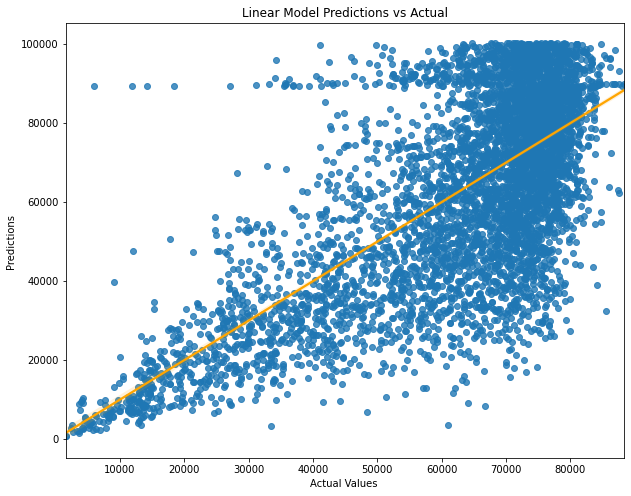

GradientBoostingRegressor(random_state=0) R2 score: 0.4895000491933905
Mean Absolute Error: 14047.331771609452
Mean Squared Error: 17724.594008364867


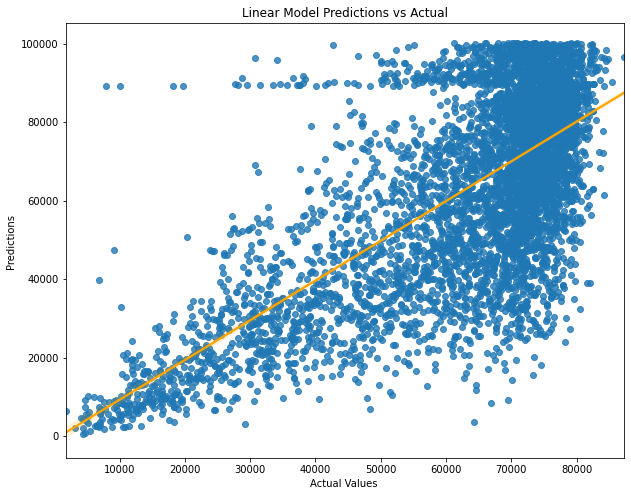

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.38908021442038
Mean Absolute Error: 15100.302678521368
Mean Squared Error: 19389.675426004615


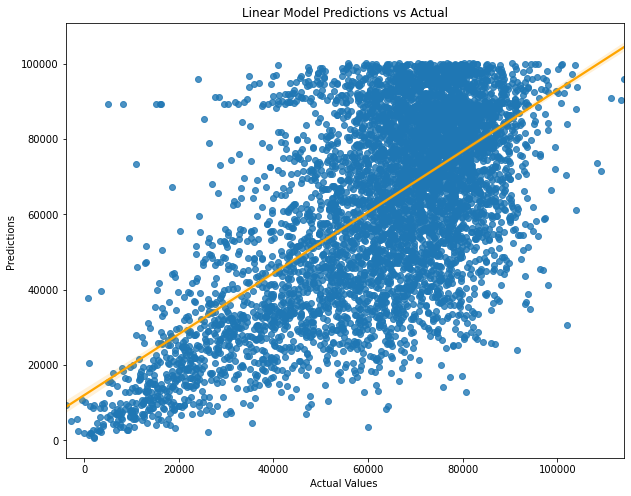

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.46479061682881195
Mean Absolute Error: 14176.412412830728
Mean Squared Error: 18148.481927928886


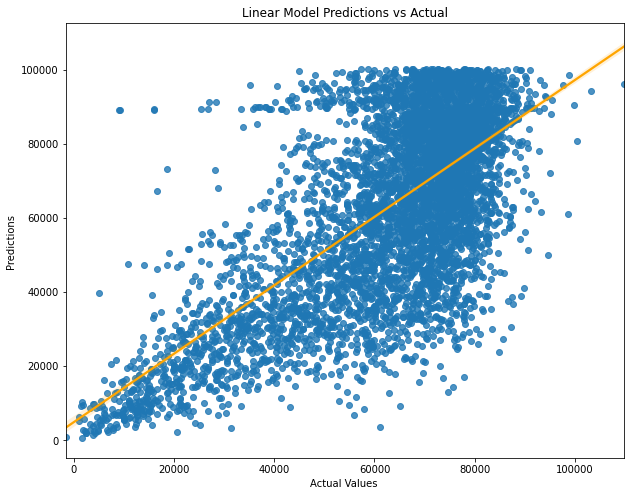

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.47666947395702475
Mean Absolute Error: 14029.162143017518
Mean Squared Error: 17945.95101351353


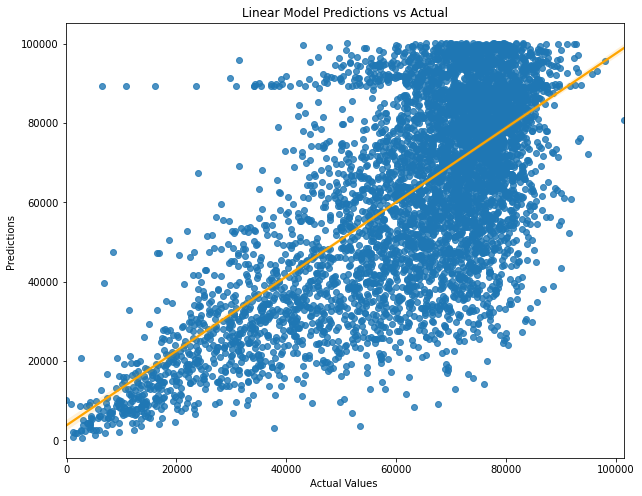

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.49384045650513986
Best Mean Absolute Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 13934.793759488488
Best Mean Squared Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 17649.083540425177


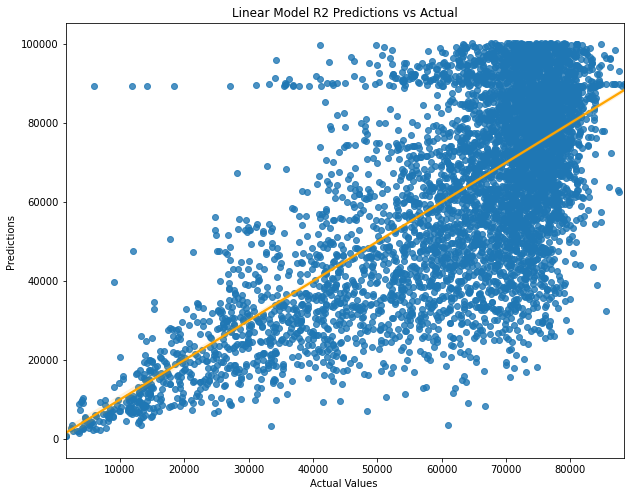

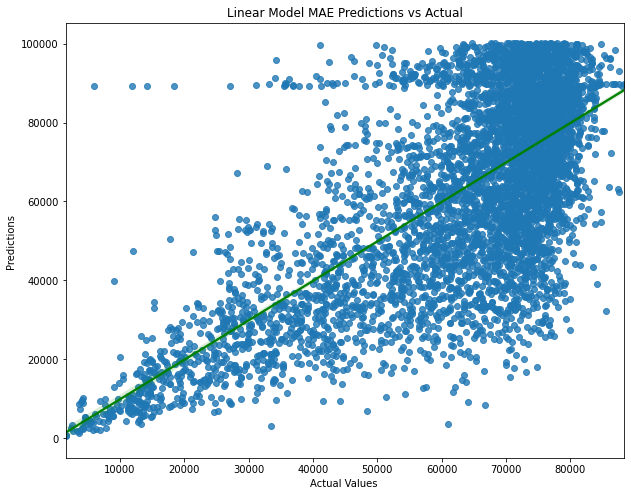

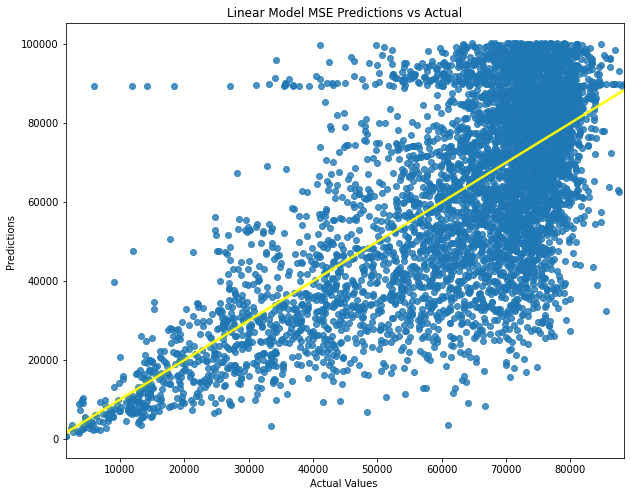

(RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [32]:
work_smart(m_men, 'Pornhub_rank', model_list)

LinearRegression() R2 score: -6.3398523470279295e+19
Mean Absolute Error: 17308726555291.732
Mean Squared Error: 203331497793628.2


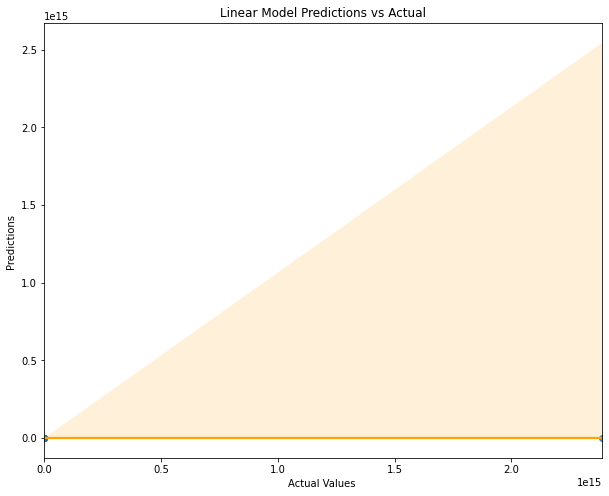

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.34298202468896466
Mean Absolute Error: 14432.3961352657
Mean Squared Error: 20699.207294560543


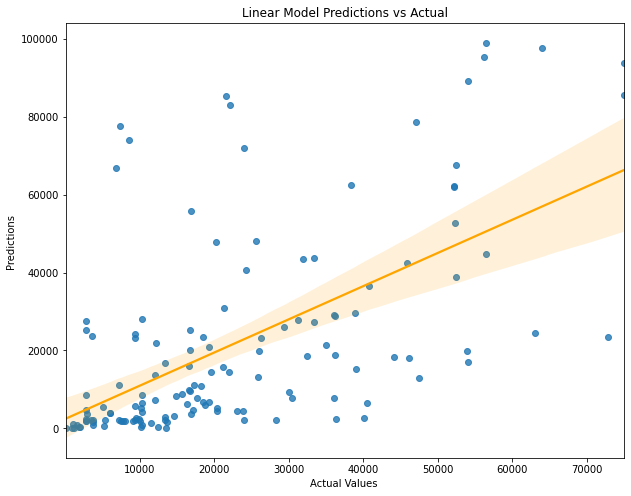

KNeighborsRegressor(n_jobs=10) R2 score: 0.4075443234389049
Mean Absolute Error: 14101.55652173913
Mean Squared Error: 19655.90391844177


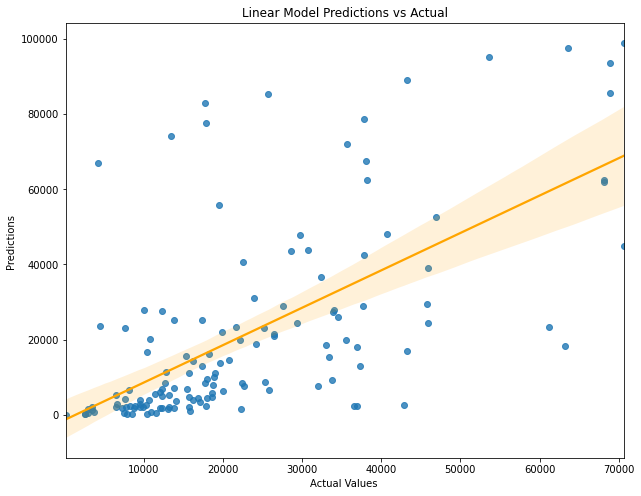

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.4075176080213815
Mean Absolute Error: 14137.965838509319
Mean Squared Error: 19656.347082193228


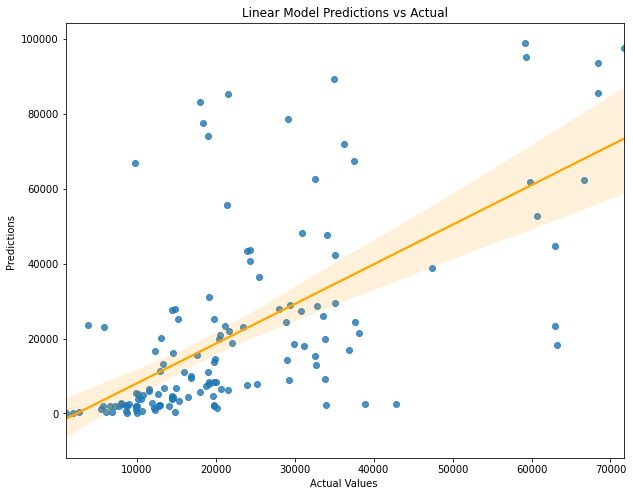

MLPRegressor(random_state=42) R2 score: -0.6699176019315245
Mean Absolute Error: 21133.202131365622
Mean Squared Error: 32999.898896175575


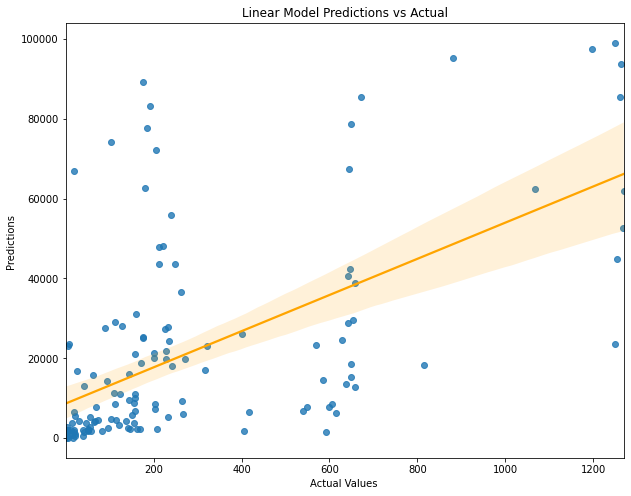

RandomForestRegressor() R2 score: 0.6619544878425794
Mean Absolute Error: 8287.824420289855
Mean Squared Error: 14847.47748632365


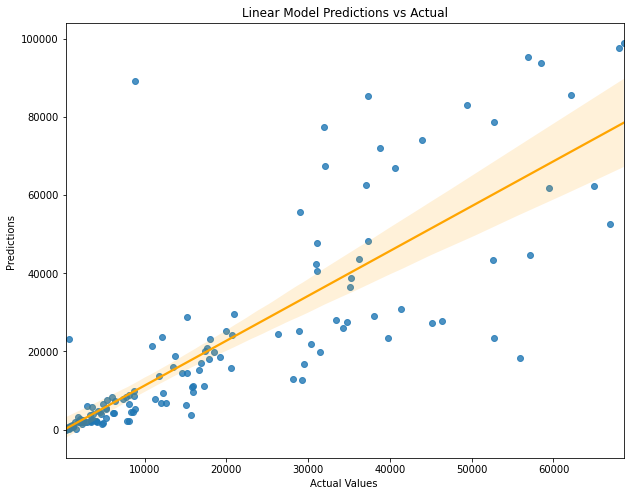

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.6735764044041649
Mean Absolute Error: 8200.01749782626
Mean Squared Error: 14590.019092650226


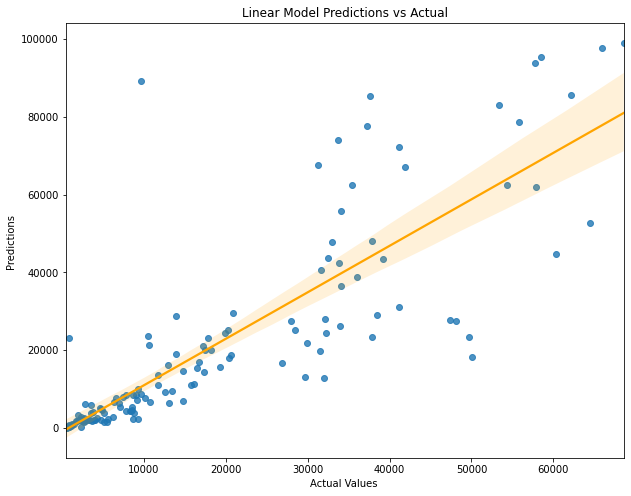

GradientBoostingRegressor(random_state=0) R2 score: 0.6502877857180719
Mean Absolute Error: 8647.209995378158
Mean Squared Error: 15101.513964824864


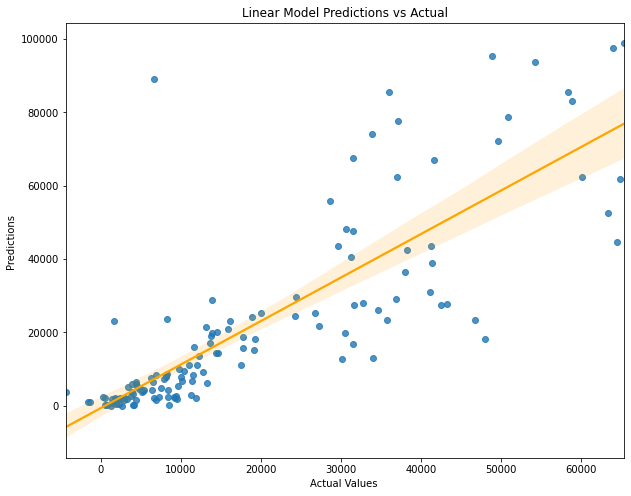

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.622956952254418
Mean Absolute Error: 9084.909434553505
Mean Squared Error: 15680.523465723629


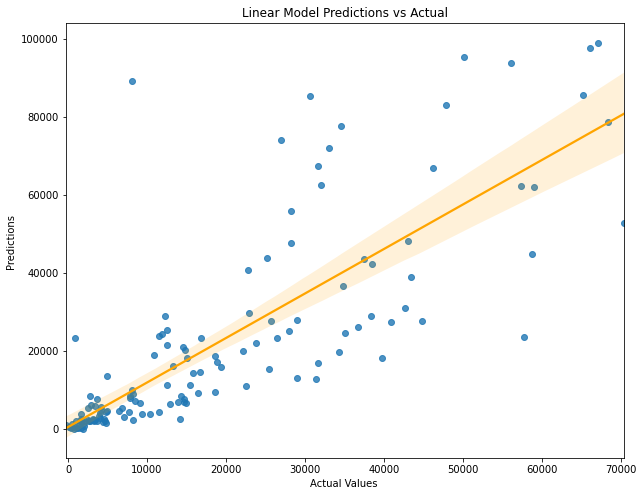

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6230299339870848
Mean Absolute Error: 9083.38591467816
Mean Squared Error: 15679.005804594559


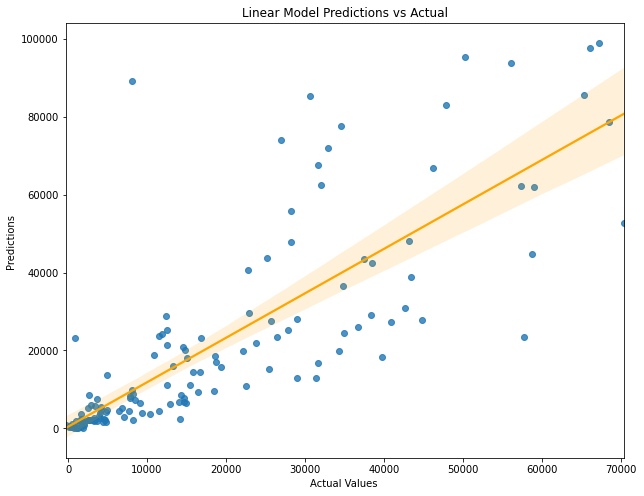

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6494003168775082
Mean Absolute Error: 8854.612355992414
Mean Squared Error: 15120.663469234476


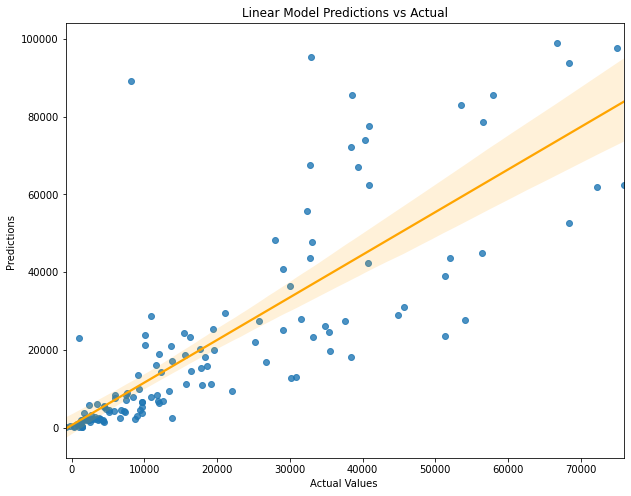

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.6735764044041649
Best Mean Absolute Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 8200.01749782626
Best Mean Squared Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 14590.019092650226


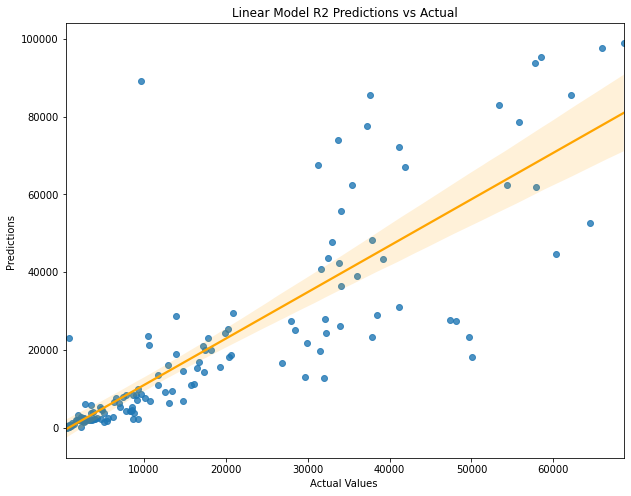

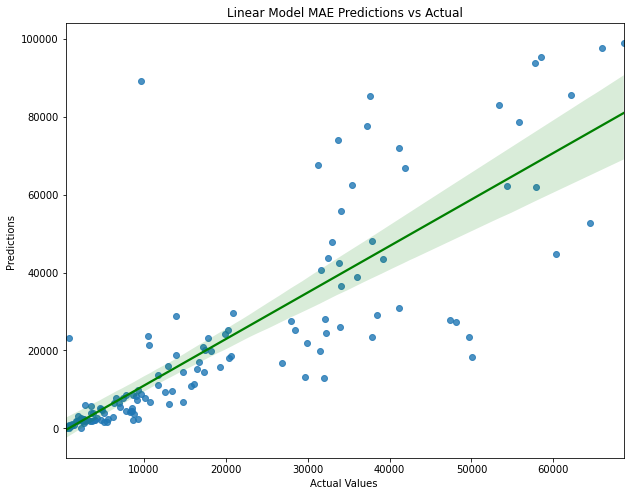

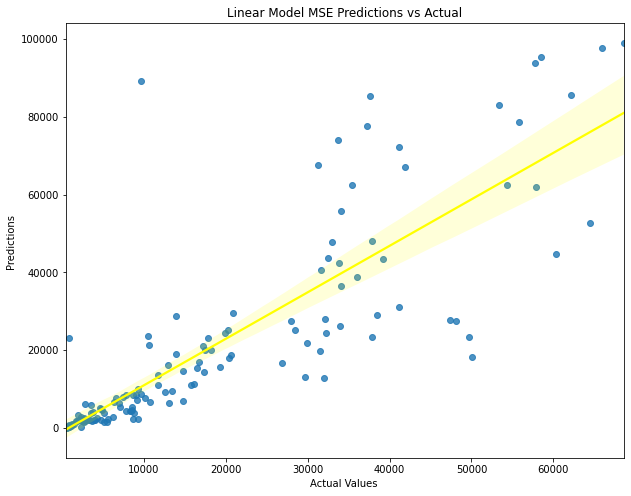

(RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [33]:
work_smart(p_men, 'Pornhub_rank', model_list)

LinearRegression() R2 score: -5.394941447027205e+25
Mean Absolute Error: 2.4333886922734324e+16
Mean Squared Error: 1.3588785748787704e+17


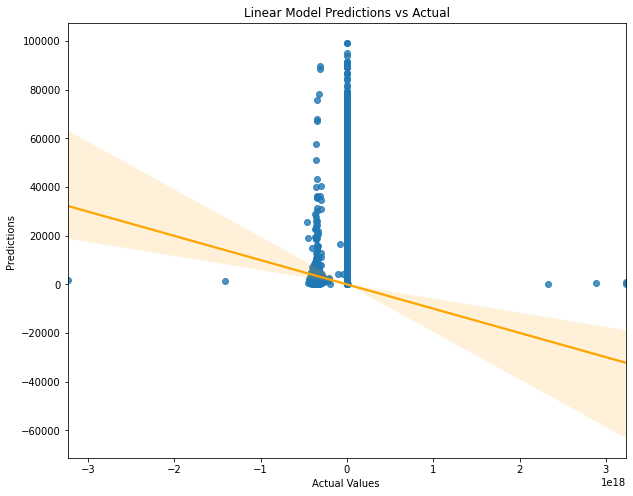

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.5622806185310432
Mean Absolute Error: 7931.939974457215
Mean Squared Error: 12240.10580578073


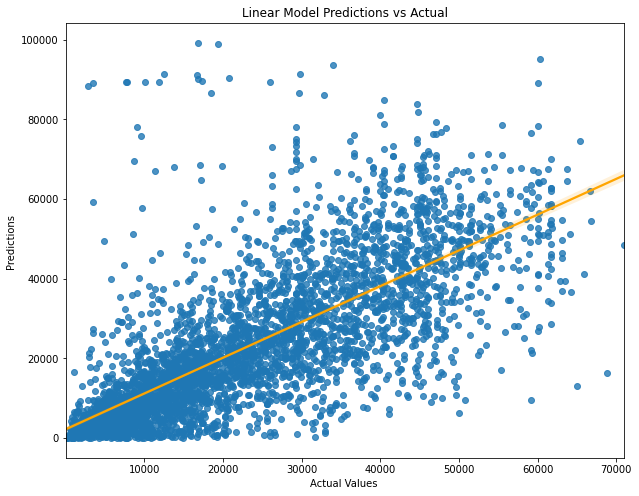

KNeighborsRegressor(n_jobs=10) R2 score: 0.6045411420154658
Mean Absolute Error: 7572.524233716475
Mean Squared Error: 11634.23782838948


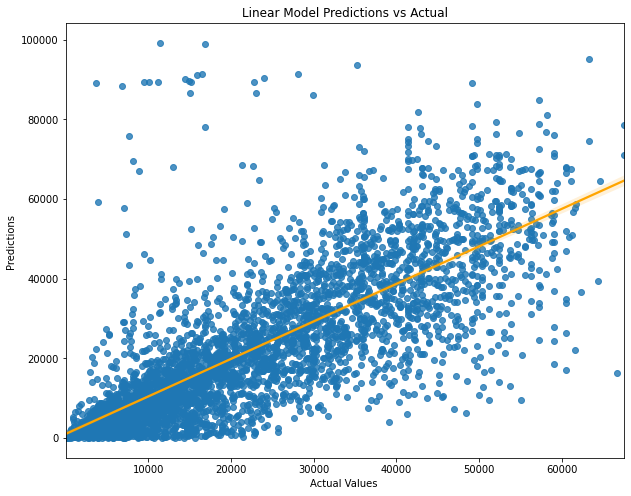

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.616789293324449
Mean Absolute Error: 7510.80661603722
Mean Squared Error: 11452.652957579208


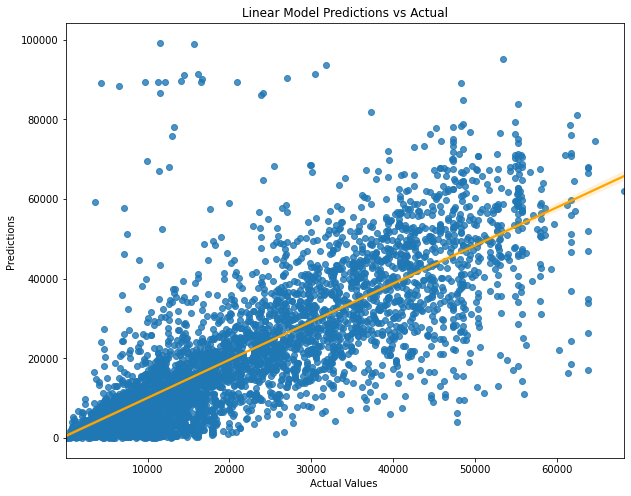

MLPRegressor(random_state=42) R2 score: 0.295779144374789
Mean Absolute Error: 12042.227267593187
Mean Squared Error: 15525.361626815002


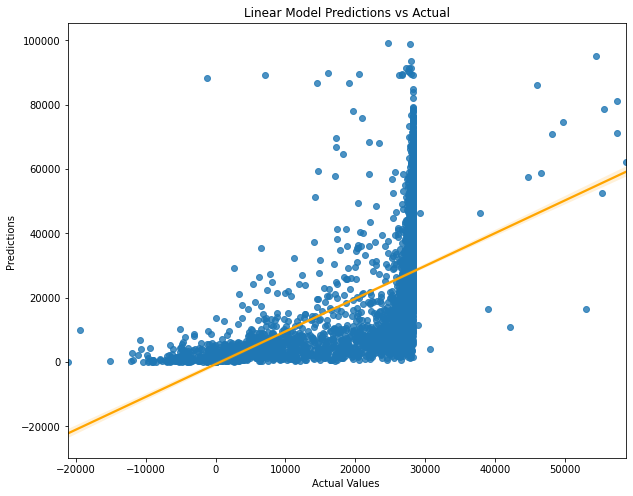

RandomForestRegressor() R2 score: 0.6782493093329234
Mean Absolute Error: 6374.381531034222
Mean Squared Error: 10494.144197395226


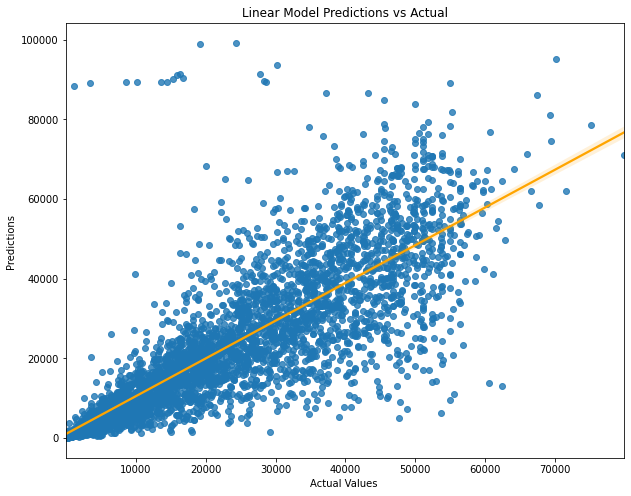

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.7088174644653809
Mean Absolute Error: 5984.818488981257
Mean Squared Error: 9983.203988891673


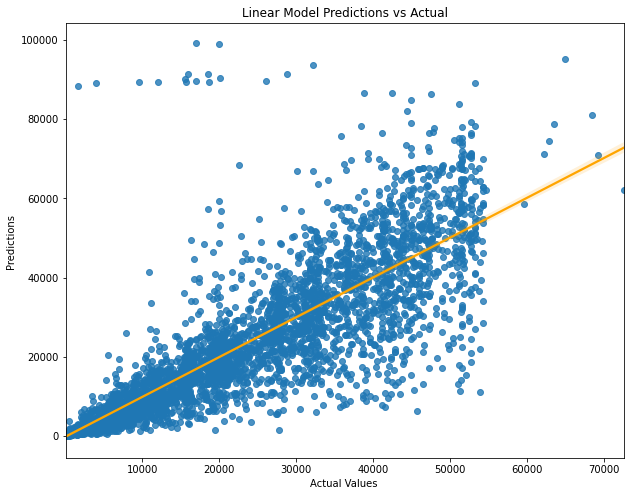

GradientBoostingRegressor(random_state=0) R2 score: 0.701362194480971
Mean Absolute Error: 6145.062024019729
Mean Squared Error: 10110.198357169778


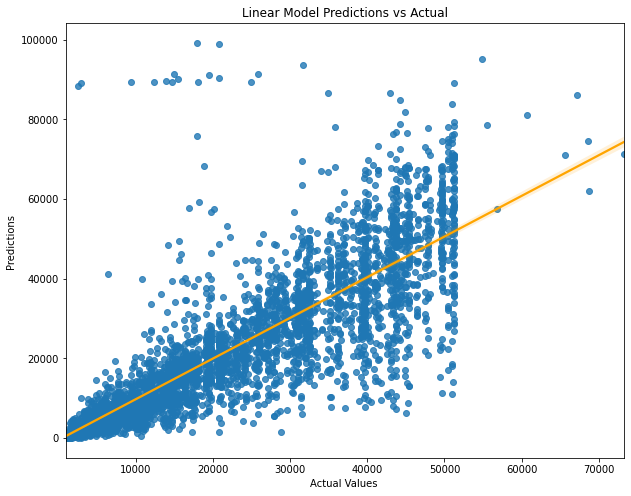

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6420563138225724
Mean Absolute Error: 6827.924948462124
Mean Squared Error: 11068.649534362756


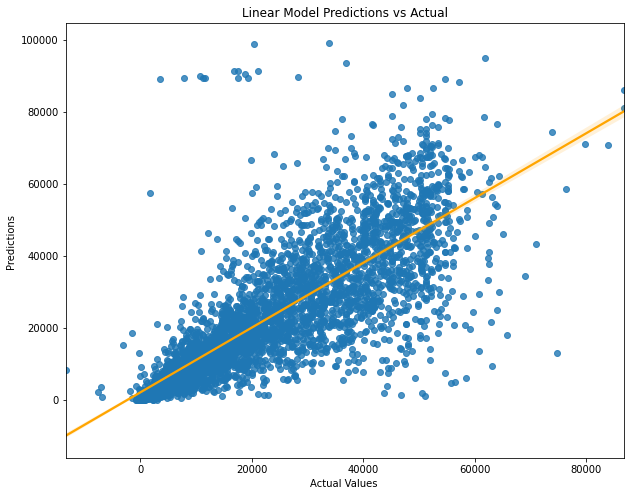

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7012084015333224
Mean Absolute Error: 6099.395184809221
Mean Squared Error: 10112.801304697196


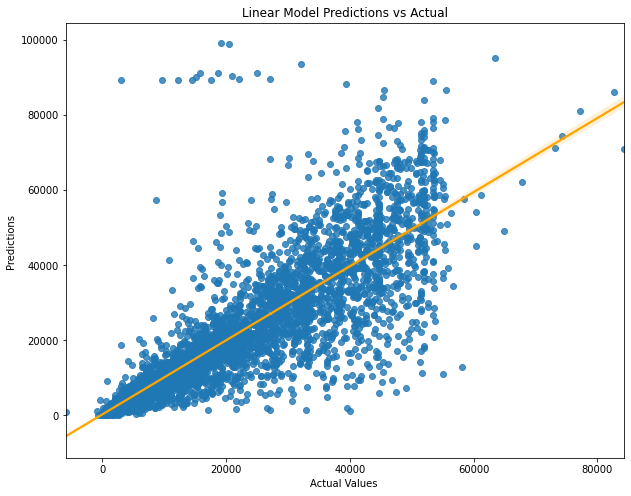

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.7033631875469546
Mean Absolute Error: 6051.998791113895
Mean Squared Error: 10076.270236795799


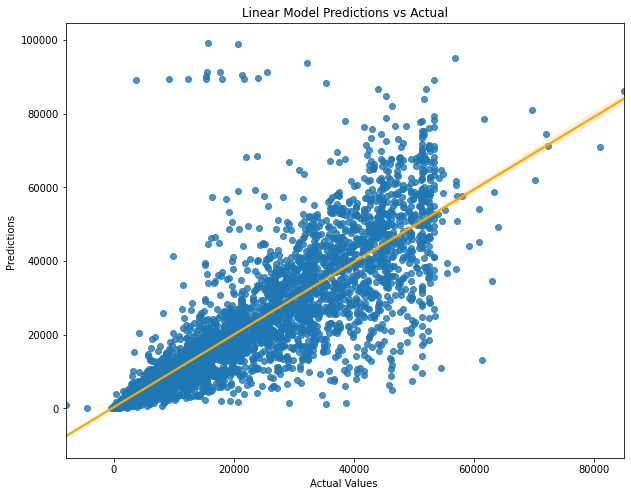

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.7088174644653809
Best Mean Absolute Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 5984.818488981257
Best Mean Squared Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 9983.203988891673


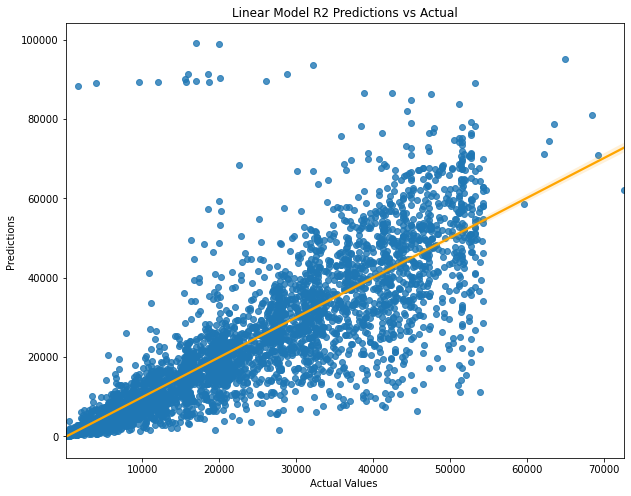

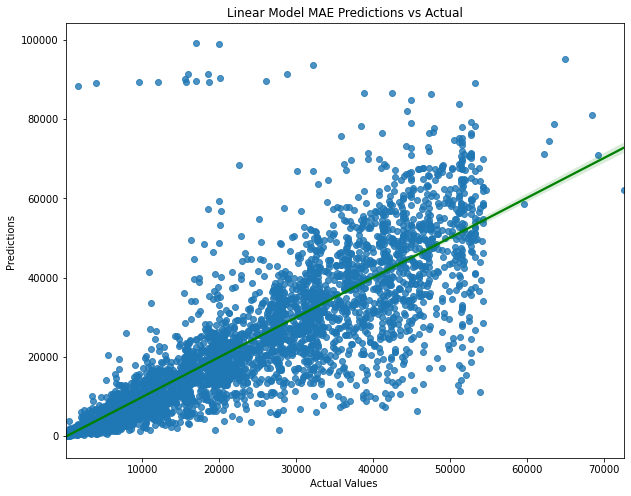

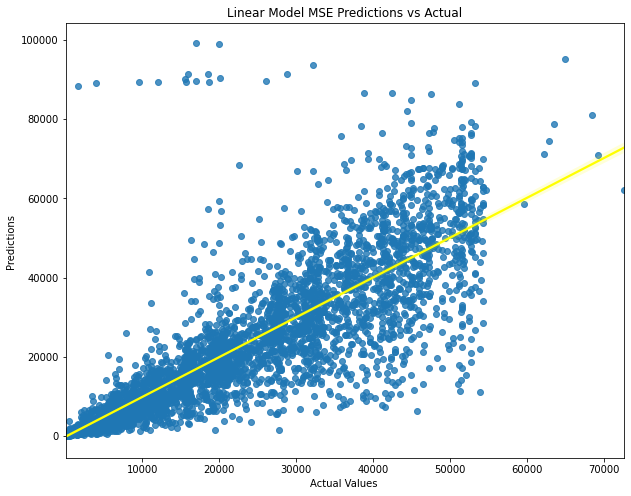

(RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [34]:
work_smart(p_women, 'Pornhub_rank', model_list)

LinearRegression() R2 score: -9.96482740518638e+24
Mean Absolute Error: 1.8919990375181984e+16
Mean Squared Error: 8.574603655276514e+16


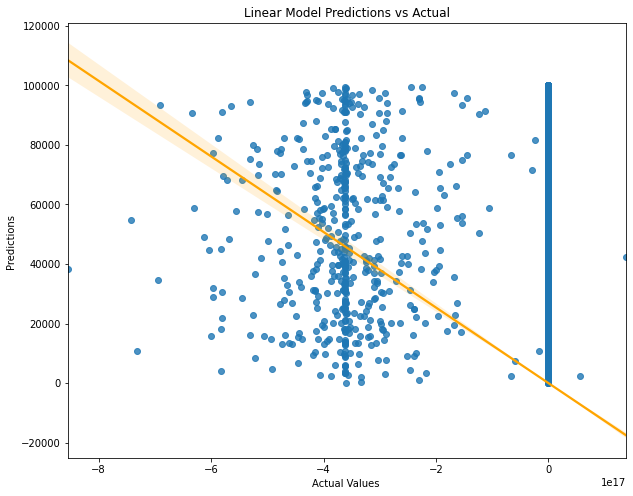

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.057235954147516144
Mean Absolute Error: 21434.214615539047
Mean Squared Error: 26374.283491802187


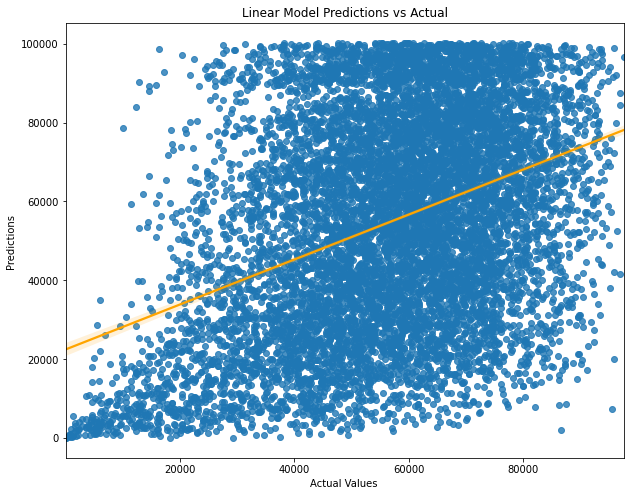

KNeighborsRegressor(n_jobs=10) R2 score: 0.14253829495541714
Mean Absolute Error: 20689.192692230474
Mean Squared Error: 25152.811194654507


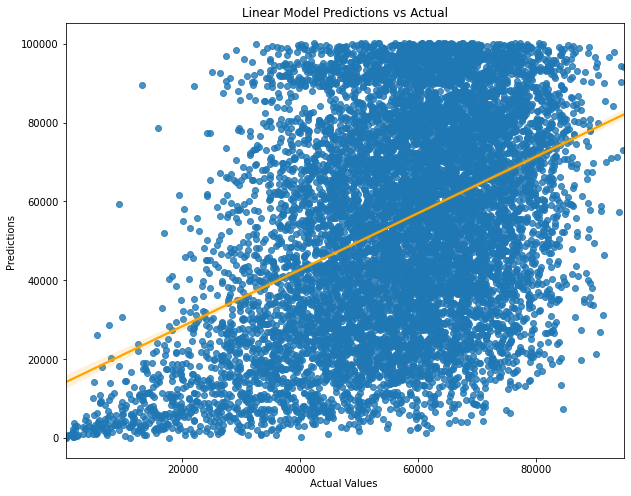

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.18168629335401099
Mean Absolute Error: 20332.46673071959
Mean Squared Error: 24571.91911623506


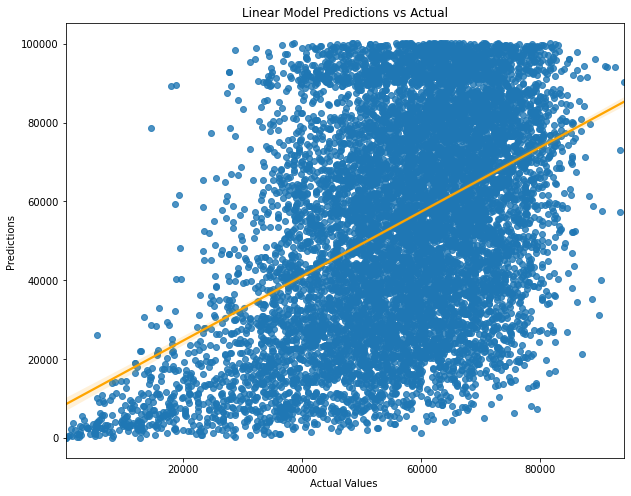

MLPRegressor(random_state=42) R2 score: 0.2990733104061948
Mean Absolute Error: 18710.374851100827
Mean Squared Error: 22741.30918871011


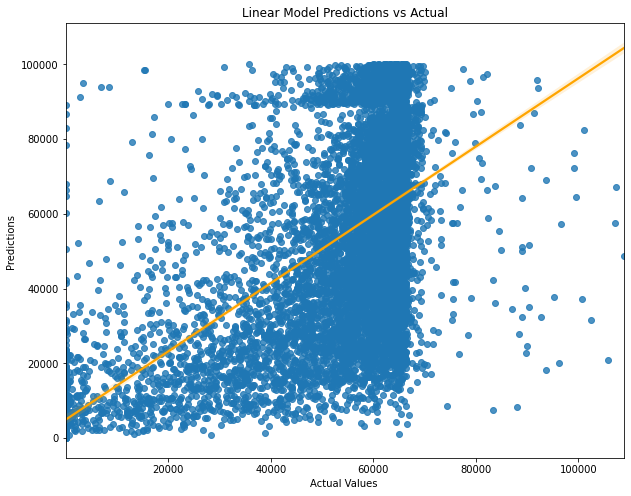

RandomForestRegressor() R2 score: 0.5199614900998277
Mean Absolute Error: 14766.084803252359
Mean Squared Error: 18819.895332582986


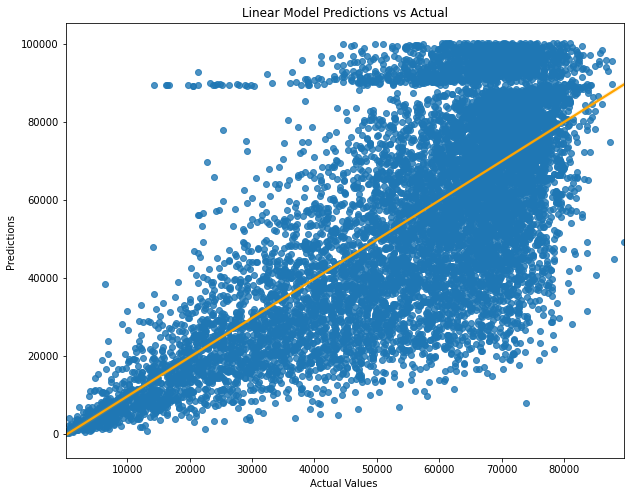

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.528332483946014
Mean Absolute Error: 14688.307198158507
Mean Squared Error: 18655.08137818439


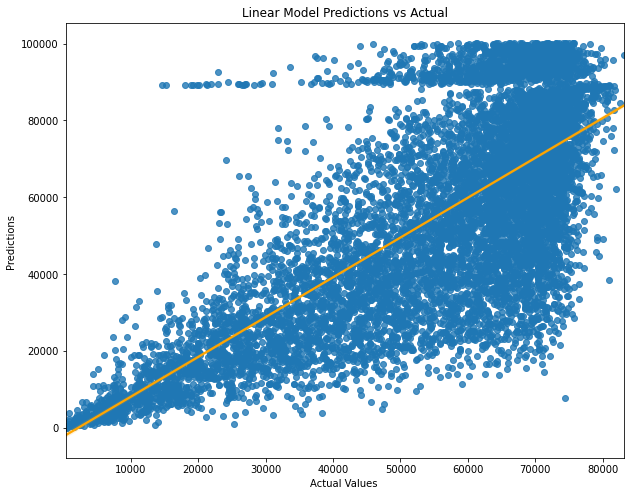

GradientBoostingRegressor(random_state=0) R2 score: 0.5194545272968074
Mean Absolute Error: 14914.783519104152
Mean Squared Error: 18829.830440905553


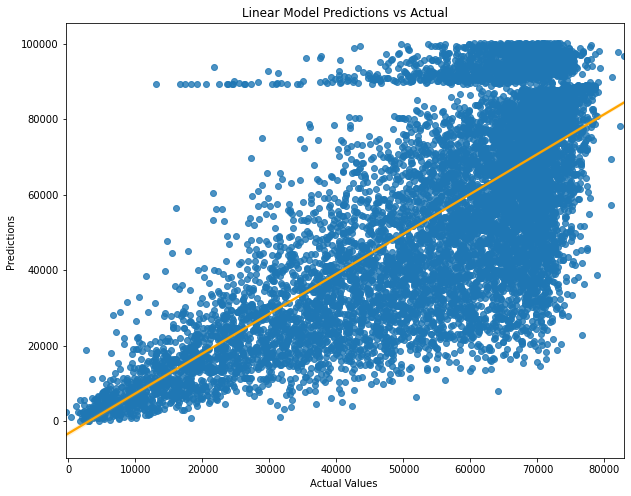

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.4966022634887033
Mean Absolute Error: 15066.949381197248
Mean Squared Error: 19272.355295184967


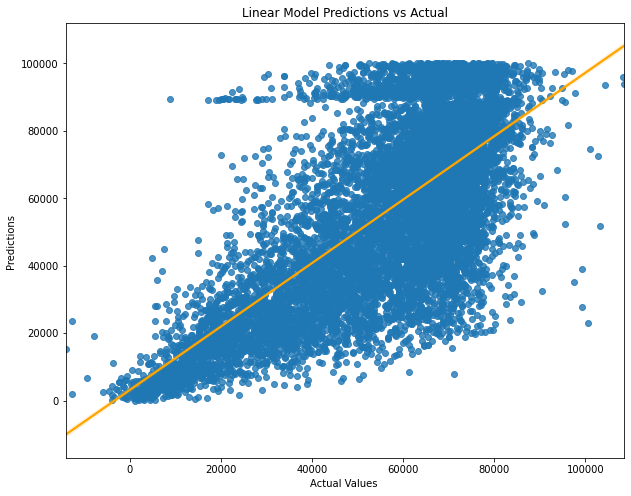

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.5277282653884949
Mean Absolute Error: 14651.275167665479
Mean Squared Error: 18667.026380157426


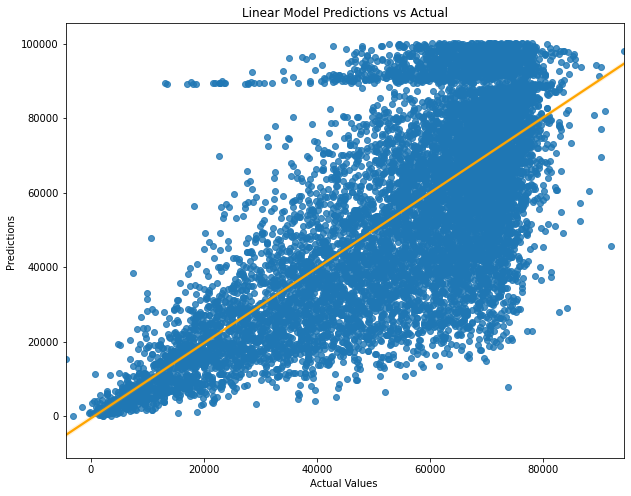

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.5326553798322371
Mean Absolute Error: 14590.781407845066
Mean Squared Error: 18569.39643949361


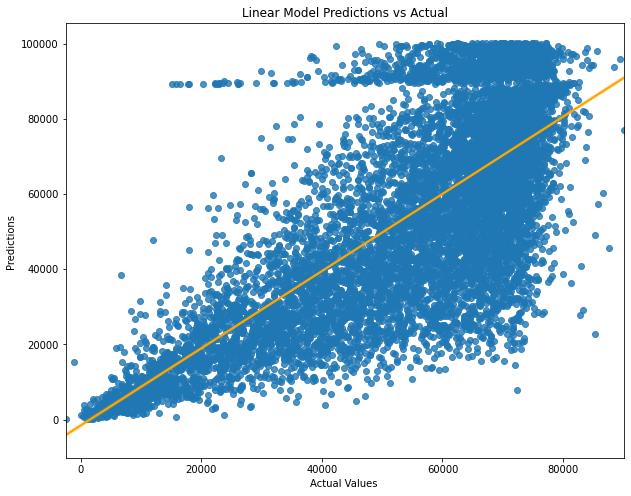

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.5326553798322371
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, 

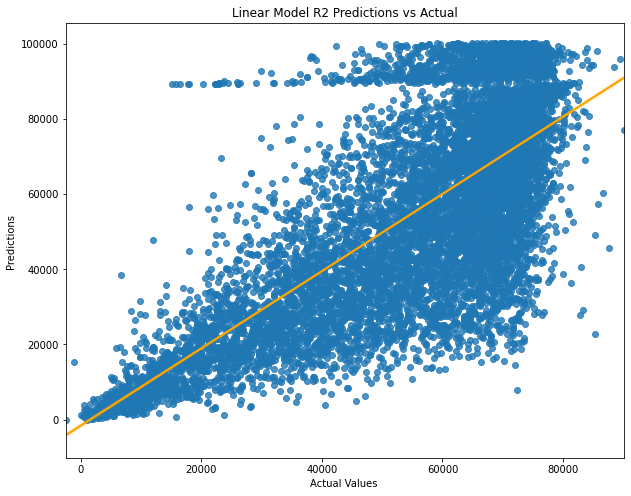

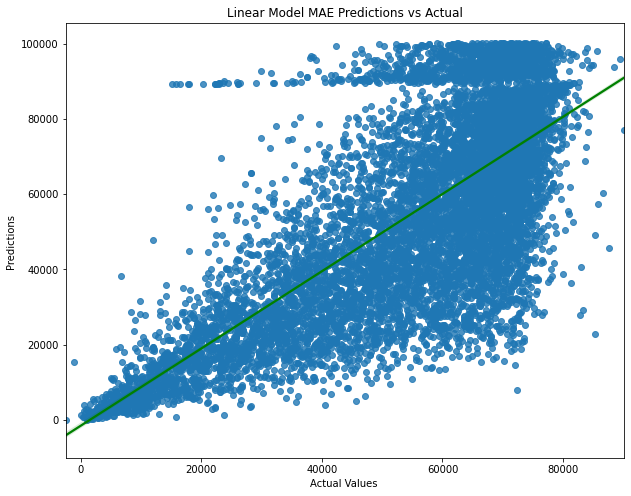

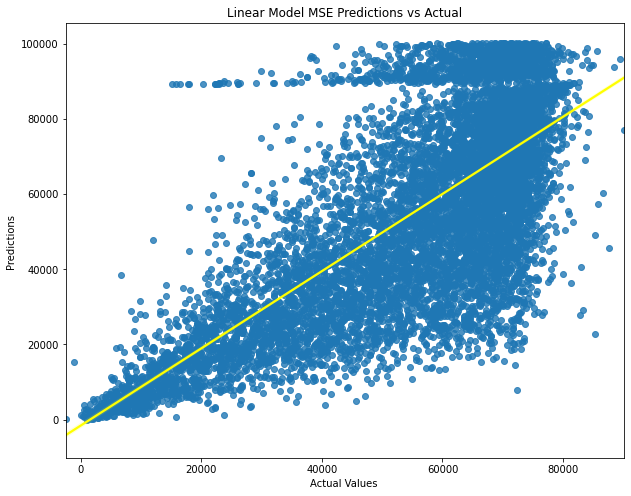

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_st

In [35]:
m_women = models[(models['Gender'] == "-") | (models['Gender'] == "Female") | (models['Gender'] == "Other")]
work_smart(m_women, 'Pornhub_rank', model_list)

In [36]:
corr_matrix = p_women.corr()
print(corr_matrix["Pornhub_rank"].sort_values(ascending=False))

Pornhub_rank              1.000000
Pornstar_rank             0.917186
Verified_member           0.111068
Pornhub_awards_winner    -0.041079
Fan_club_material        -0.045387
Premium_user             -0.054209
Profile Views            -0.100468
Paid_videos              -0.108173
Videos Watched           -0.109513
Pornstar_or_model        -0.109888
Age                      -0.112520
Pornstar Profile Views   -0.118451
Subscribers              -0.133654
Fake Boobs               -0.153394
Joined                   -0.179913
Videos_views             -0.247484
Career Status            -0.255224
Verified_pornstar        -0.259312
Uploaded_by_actor        -0.322762
Weight                   -0.417772
Height                   -0.446632
Model_rank                     NaN
Name: Pornhub_rank, dtype: float64


In [37]:
dfcat = df.select_dtypes(object)

In [38]:
df.dtypes

Bio                        object
Subscribers                 int64
Videos_views                int64
Pornhub_rank                int64
Uploaded_by_actor         float64
Paid_videos               float64
Fan_club_material         float64
Verified_pornstar           int64
Verified_member             int64
Premium_user                int64
Pornhub_awards_winner       int64
Age                         int64
Background                 object
Birthday                   object
Birthplace                 object
Born                       object
Career Start and End       object
Career Status               int64
City and Country           object
Endowment                  object
Ethnicity                  object
Eye Color                  object
Facial Hair                object
Fake Boobs                  int64
Foreskin                   object
Gender                     object
Hair Color                 object
Height                      int64
Weight                      int64
Interested in 

In [39]:
remove_cols = []

for col in dfcat:
    remove_cols.append(col)
        
len(remove_cols)

25

In [40]:
remove_cols

['Bio',
 'Background',
 'Birthday',
 'Birthplace',
 'Born',
 'Career Start and End',
 'City and Country',
 'Endowment',
 'Ethnicity',
 'Eye Color',
 'Facial Hair',
 'Foreskin',
 'Gender',
 'Hair Color',
 'Interested in',
 'Interests and hobbies',
 'Measurements',
 'Piercings',
 'Relationship status',
 'Star Sign',
 'Tattoos',
 'Turn Offs',
 'Turn Ons',
 'Video Views',
 'Hometown']

In [41]:
remove_cols.extend(['Pornhub_rank', "Model_rank", 'Pornstar_rank'])

In [42]:
from sklearn.feature_selection import RFE
from sklearn import linear_model
y = df['Pornhub_rank']
X = df.drop(columns=remove_cols, axis=1)
X = pd.get_dummies(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = GradientBoostingRegressor(random_state=0)
rfe = RFE(model, n_features_to_select=13, verbose=False)
rfe.fit(X_train, y_train)
dt = pd.DataFrame(data = rfe.ranking_, columns=['Rank'])
dt['Column_name'] = X.columns
cols_to_keep = dt[dt['Rank']==1]['Column_name']
cols_to_keep

0           Subscribers
1          Videos_views
2     Uploaded_by_actor
3           Paid_videos
4     Fan_club_material
6       Verified_member
9                   Age
12               Height
13               Weight
14               Joined
16        Profile Views
17       Videos Watched
18    Pornstar_or_model
Name: Column_name, dtype: object

0.6402945254695571


<AxesSubplot:ylabel='Pornhub_rank'>

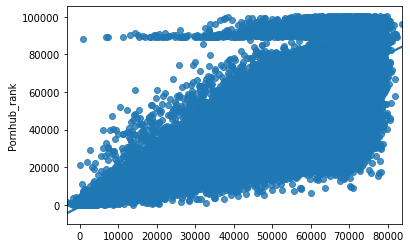

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X[cols_to_keep], y, test_size=0.3, random_state=42)

model.fit(X_train,y_train)
print(model.score(X_test,y_test))

preds = model.predict(X_test)
sns.regplot(preds, y_test)

In [44]:
def work_smart2(data, target, cols_to_keep, model_list):
    X = pd.get_dummies(data[cols_to_keep])
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train, X_test = (scaler.transform(X_train), scaler.transform(X_test))
    results = {}
    results_mae = {}
    results_mse = {}
    for model in model_list:
        model.fit(X_train, y_train)
        results[model] = model.score(X_test, y_test)
        print(model, 'R2 score:', model.score(X_test, y_test))
        y_pred = model.predict(X_test)
        results2 = mean_absolute_error(y_test, y_pred)
        results3 = mean_squared_error(y_test, y_pred, squared=False)
        print('Mean Absolute Error:', results2)
        print('Mean Squared Error:', results3)
        results_mae[model] = results2
        results_mse[model] = results3
        plt.figure(figsize=(10,8))
        sns.regplot(x=y_pred, y=y_test, line_kws={"color": "orange"})
        plt.xlabel('Actual Values ')
        plt.ylabel('Predictions ')
        plt.title('Linear Model Predictions vs Actual')
        plt.show()
    final_result_r2 = max(results.values())
    final_result_mae = min(results_mae.values())
    final_result_mse = min(results_mse.values())
    print("--------------------------------------------------------------------------------------------------------")
    print('TAA DAAA!! AND THE WINNER IIIISSSSS:')
    print("--------------------------------------------------------------------------------------------------------")
    best_mae_model = min(results_mae, key=results_mae.get)
    best_r2_model = max(results, key=results.get)
    best_mse_model = min(results_mse, key=results_mse.get)
    print('Best R2:', best_r2_model, final_result_r2)
    print('Best Mean Absolute Error:', best_mae_model, final_result_mae)
    print('Best Mean Squared Error:', best_mse_model, final_result_mse)
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_r2_model.predict(X_test), y=y_test, line_kws={"color": "orange"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model R2 Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mae_model.predict(X_test), y=y_test, line_kws={"color": "green"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MAE Predictions vs Actual')
    plt.show()
    plt.figure(figsize=(10,8))
    sns.regplot(x=best_mse_model.predict(X_test), y=y_test, line_kws={"color": "yellow"})
    plt.xlabel('Actual Values ')
    plt.ylabel('Predictions ')
    plt.title('Linear Model MSE Predictions vs Actual')
    plt.show()
    return best_mae_model, best_mse_model, best_r2_model

LinearRegression() R2 score: 0.3096886969782694
Mean Absolute Error: 19856.827623542213
Mean Squared Error: 23823.429105339652


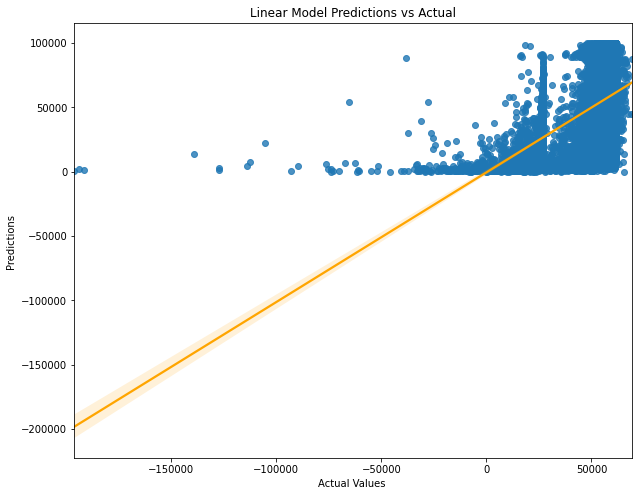

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.36274409468056845
Mean Absolute Error: 17472.705033552535
Mean Squared Error: 22889.62698547131


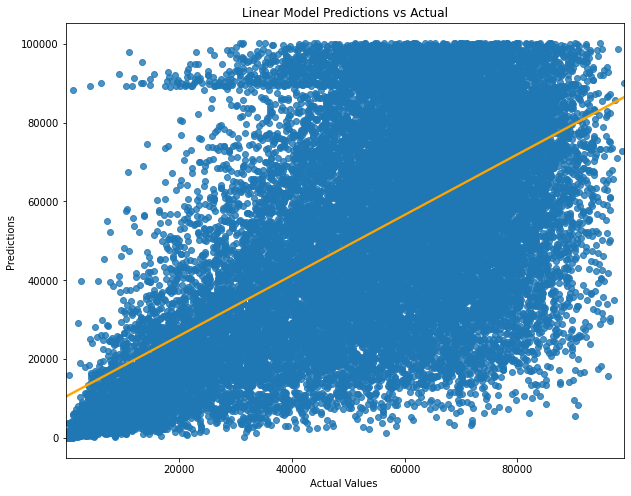

KNeighborsRegressor(n_jobs=10) R2 score: 0.4228260832540689
Mean Absolute Error: 16766.005067172307
Mean Squared Error: 21783.874649804333


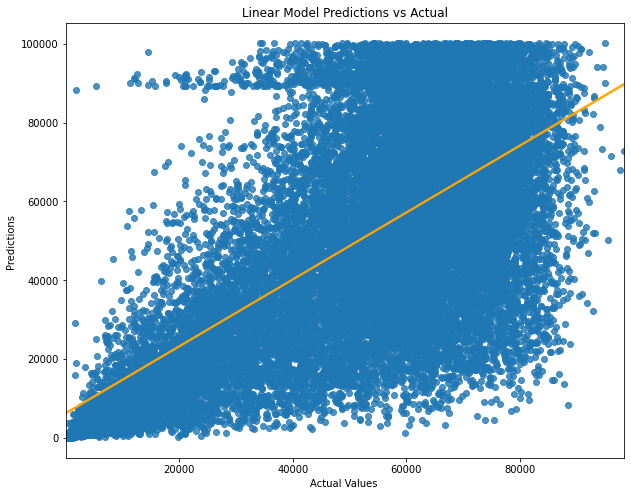

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.44766102726594204
Mean Absolute Error: 16484.507189828768
Mean Squared Error: 21310.057667866928


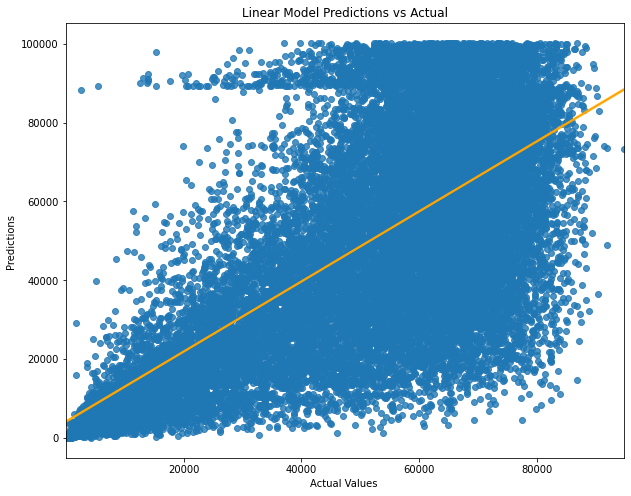

MLPRegressor(random_state=42) R2 score: 0.4851151067453191
Mean Absolute Error: 16551.88699877633
Mean Squared Error: 20574.858444095316


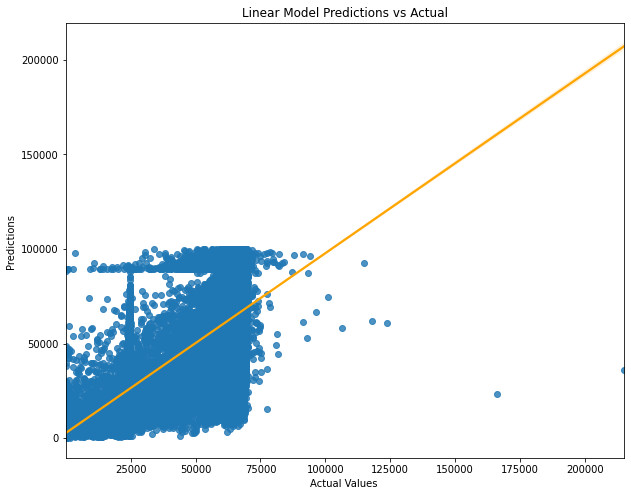

RandomForestRegressor() R2 score: 0.6398088778109756
Mean Absolute Error: 12953.437842751107
Mean Squared Error: 17208.708702527863


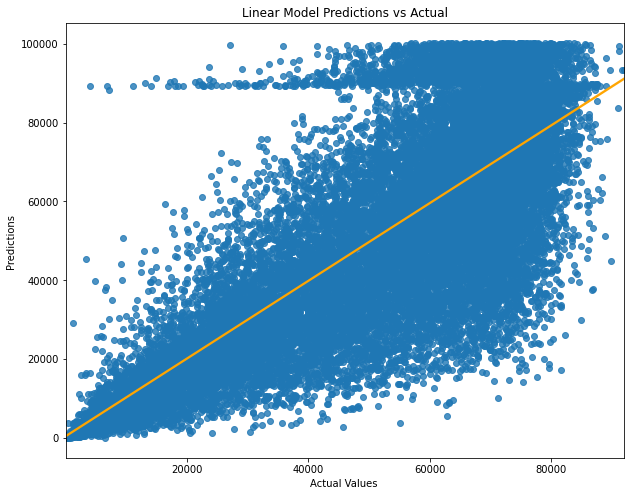

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.6490959669451283
Mean Absolute Error: 12780.578107645288
Mean Squared Error: 16985.40712179913


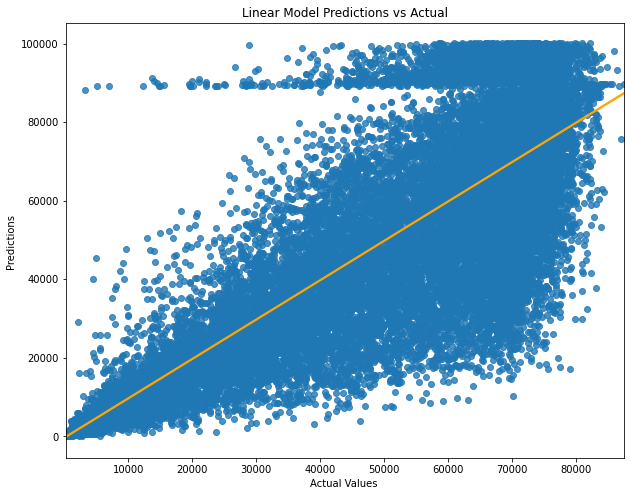

GradientBoostingRegressor(random_state=0) R2 score: 0.6397455040095104
Mean Absolute Error: 13069.299387943316
Mean Squared Error: 17210.222528459795


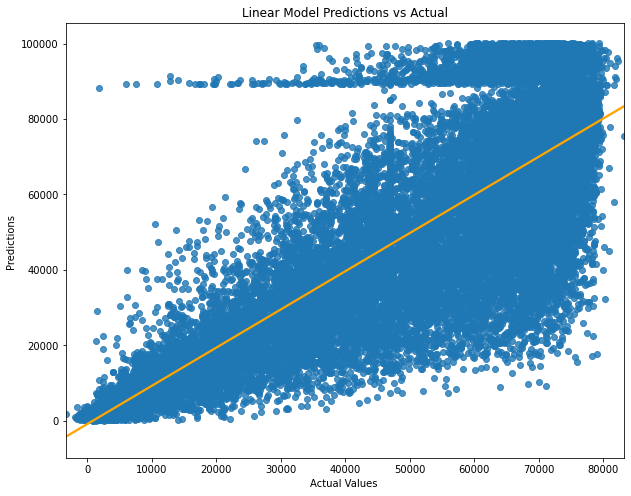

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6061850643550939
Mean Absolute Error: 13495.488273747611
Mean Squared Error: 17994.00647897401


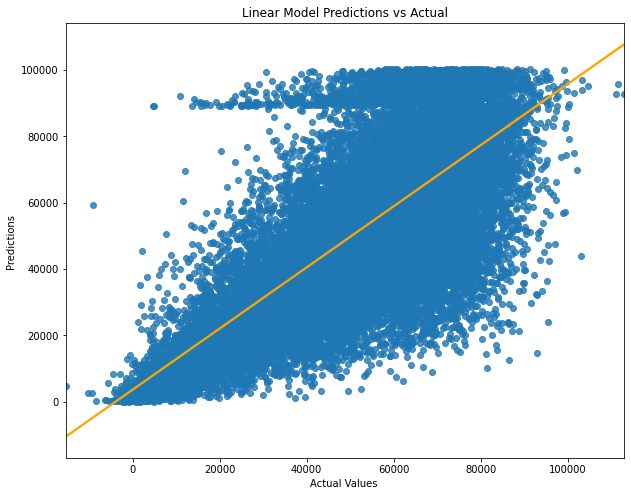

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6466418050968101
Mean Absolute Error: 12775.626134021913
Mean Squared Error: 17044.700124549312


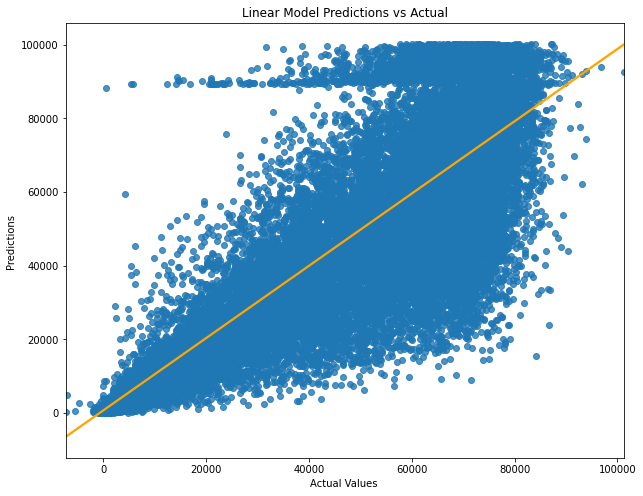

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6493331484661207
Mean Absolute Error: 12719.848603325237
Mean Squared Error: 16979.66580038497


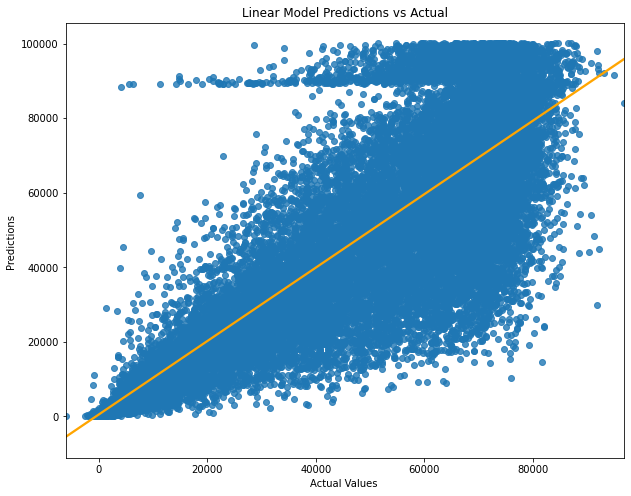

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.6493331484661207
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, 

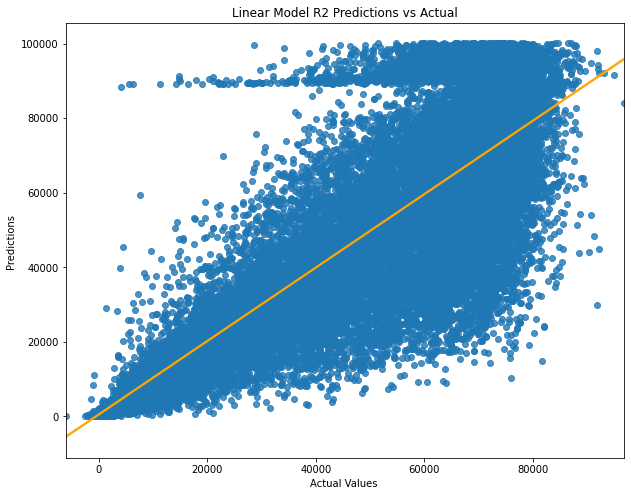

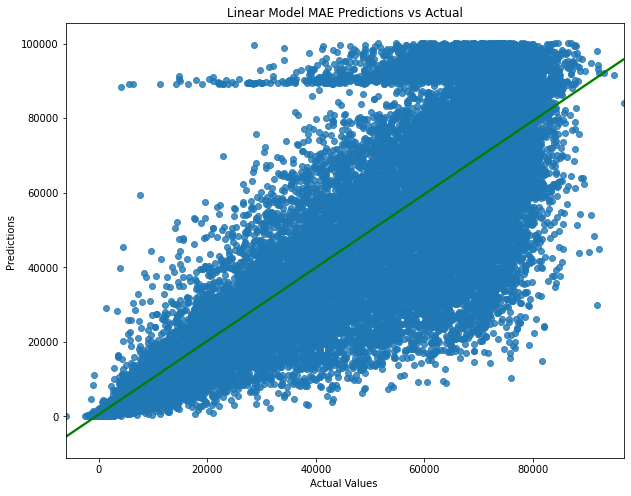

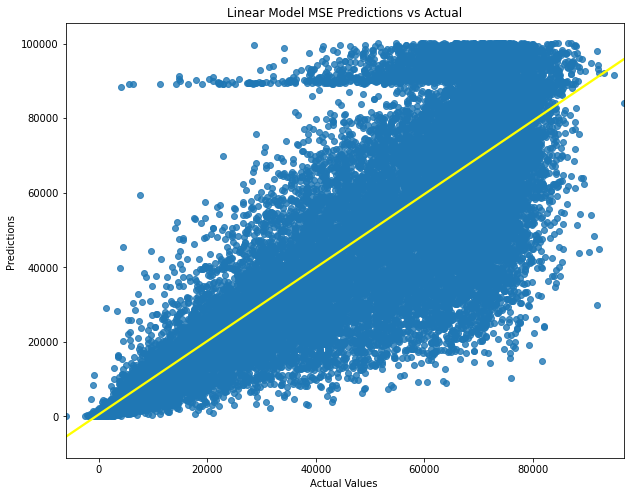

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_st

In [45]:
work_smart2(df, 'Pornhub_rank', cols_to_keep, model_list)

In [46]:
df2 = df[df['Pornhub_rank'] < 60000]

In [47]:
df2.head()

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Lana Rhoades,Lana Rhoades is a Virgo born in September of 1...,14000000,903120820,1,26.0,6.0,0.0,1,0,0,1,24,-,6-Sep-96,"Chicago, Illinois, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,165,52,Guys and Girls,-,3,34D-23-35,Unknown,121140882.0,192086347,Open,Virgo,No,-,-,-,51,-,0.0,1.0,1.0
Abella Danger,"Danger might be her last name, but when it com...",868000,862007676,2,3.0,0.0,0.0,1,0,1,1,19,-,1-Jan-01,"Miami, Florida, United States of America",-,to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Brunette,163,59,Guys and Girls,-,1,32C-24-32,Unknown,71825882.0,102153809,Single,Scorpio,No,-,-,-,17,-,0.0,2.0,1.0
Riley Reid,American pornstar Riley Reid was born in May o...,15000000,1074883174,3,157.0,4.0,0.0,1,0,0,1,29,-,9-Jul-91,"Loxahatchee, Florida, United States of America",-,2011 to Present,1,"Los Angeles, US",-,White,-,-,0,-,Female,Blonde|Brunette,163,49,Guys and Girls,-,4,32A-25-36,Unknown,128389976.0,111081874,Single,Cancer,Yes,-,-,-,111,-,0.0,3.0,1.0
Eva Elfie,Hey! I'm a young Siberian girl and I want to p...,12000000,466905043,4,22.0,20.0,0.0,1,0,1,0,20,Russian,27-May-00,Russia,-,2018 to Present,1,"Moscow, RU",-,White,Green,-,0,-,Female,Grey,163,45,Guys and Girls,"Most of all I like playing computer games, but...",2,34C-24-35,No,16892342.0,91253351,Single,Gemini,No,-,"Smart people, shy boys and girls kisses.",-,226,-,0.0,4.0,1.0
Mia Malkova,Some girls are so damn hot that they can get y...,11000000,623234336,5,90.0,11.0,0.0,1,0,0,1,28,-,1-Jul-92,"Palm Springs, California, United States of Ame...",-,2012 to Present,1,"Portland, US",-,White,-,-,0,-,Female,Blonde,173,54,Guys and Girls,"Masturbating! Seriously, I have a problem! I l...",2,33C-21-40,No,90190178.0,73577523,Open,Gemini,No,"Cocky, Disrespectful, Unhygienic, Immature, Ye...","Sense of Humor, Great Smile, English Accents, ...",-,779,-,0.0,5.0,1.0


In [48]:
df.tail(20)

,Bio,Subscribers,Videos_views,Pornhub_rank,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_pornstar,Verified_member,Premium_user,Pornhub_awards_winner,Age,Background,Birthday,Birthplace,Born,Career Start and End,Career Status,City and Country,Endowment,Ethnicity,Eye Color,Facial Hair,Fake Boobs,Foreskin,Gender,Hair Color,Height,Weight,Interested in,Interests and hobbies,Joined,Measurements,Piercings,Pornstar Profile Views,Profile Views,Relationship status,Star Sign,Tattoos,Turn Offs,Turn Ons,Video Views,Videos Watched,Hometown,Model_rank,Pornstar_rank,Pornstar_or_model
Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
CreampieCreations,Just your average couple exploring our sexuali...,383,1441,100221,2.0,0.0,0.0,0,1,0,0,22,-,12-Jun-98,-,-,-,0,"Los Angeles, United States",-,-,-,-,0,-,Couple,Other,160,54,Guys and Girls,-,8,-,Unknown,0.0,1614,Single,Irrelevant,No,-,-,"1,441",21,-,81239.0,0.0,0.0
FatPussyBaybee,I do private and custom personal videos. Tip m...,143,994,100222,4.0,0.0,0.0,0,1,0,0,24,-,2-Sep-96,United States of America,-,-,0,"Atlanta, United States",-,Latin,-,-,0,-,Female,Black,157,68,Guys and Girls,-,2,-,Unknown,0.0,1492,Single,Irrelevant,Yes,-,-,994,22,Chicago,83280.0,0.0,0.0
Remy Rousing,Hi I'm Remy. Just your friendly neighborhood f...,314,7680,100223,15.0,0.0,58.0,0,1,0,0,26,-,17-May-94,Canada,-,-,0,-,"5-7""",White,-,No,0,Cut,Male,Blonde,180,68,Guys and Girls,-,10,-,Unknown,0.0,4949,Single,Irrelevant,No,"Lack of enthusiasm/energy during sex, selfish ...","Dominant personalities, light BDSM, chastity p...","7,680",459,-,83596.0,0.0,0.0
Ilyadevil,-,77,10528,100224,2.0,8.0,0.0,0,1,0,0,23,-,23-Jul-97,-,-,-,0,"Moscow, Russian Federation",-,-,-,-,0,-,Male,Other,0,0,Girls,-,2,-,Unknown,0.0,2962,Single,Irrelevant,No,-,-,"10,528",338,-,83252.0,0.0,0.0
PTxDemonte,Heyy welcome to our page. Were just a young in...,423,21294,100225,5.0,0.0,0.0,0,1,0,0,24,-,10-Jun-96,-,-,-,0,-,-,-,-,-,0,-,Couple,Other,0,0,Guys and Girls,-,3,-,Unknown,0.0,4020,Taken,Irrelevant,No,-,-,"21,294",33,-,83283.0,0.0,0.0
sexyandnaturalbr,Safada e inteligente. Gosto de conversar sobre...,301,324,100226,4.0,0.0,0.0,0,1,0,0,37,-,9-Jun-83,-,-,-,0,"Recife, Brazil",-,-,-,-,0,-,Female,Other,0,0,Guys and Girls,MÃºsica e cinema.,9,-,Unknown,0.0,2663,Single,Irrelevant,No,-,Pessoas gentis e de ganhar mimos,324,18,-,83912.0,0.0,0.0
Lozw89,-,302,448,100227,1.0,2.0,0.0,0,1,0,0,31,-,3-Jan-89,-,-,-,0,-,-,-,-,-,0,-,Female,Other,0,0,Guys and Girls,-,2,-,Unknown,0.0,2084,Single,Irrelevant,No,-,-,448,9,-,84137.0,0.0,0.0
ThatBadLilBoujieeB,Welcum Welcum,105,256,100228,4.0,0.0,0.0,0,1,0,0,24,-,16-Apr-96,-,-,-,0,-,-,-,-,-,0,-,Female,Other,0,0,Guys and Girls,-,1,-,Unknown,0.0,552,Single,Irrelevant,No,-,-,256,60,-,83690.0,0.0,0.0
Drevon Atlas,I'm a laid back and easy going white dude who ...,90,559,100229,5.0,0.0,0.0,0,1,0,0,24,-,17-May-96,United States of America,-,-,0,"Portland, United States","5-7""",White,-,Yes,0,Cut,Male,Other,180,74,Girls,My interests and hobbies are kinda all over th...,1,-,Yes,0.0,1316,Single,Irrelevant,Yes,"Feet; pissing (no golden showers, plz);",Thick thighs; big ass; big (natural) tits (how...,559,415,Portland,83272.0,0.0,0.0


LinearRegression() R2 score: 0.28054010680504016
Mean Absolute Error: 12309.035201700193
Mean Squared Error: 14728.8669920668


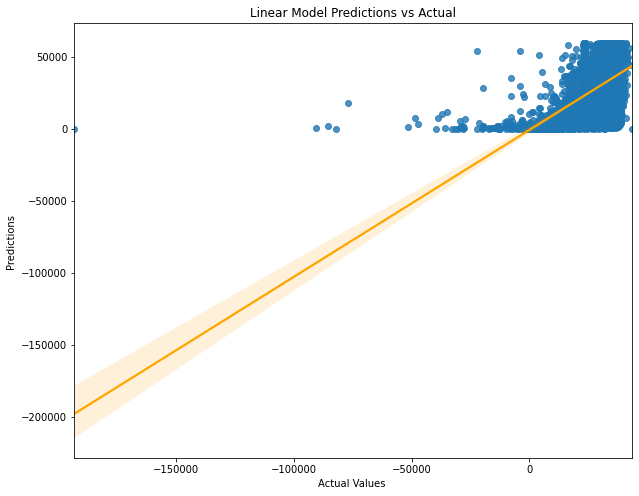

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.4497336336867882
Mean Absolute Error: 9848.92994449709
Mean Squared Error: 12881.087492092214


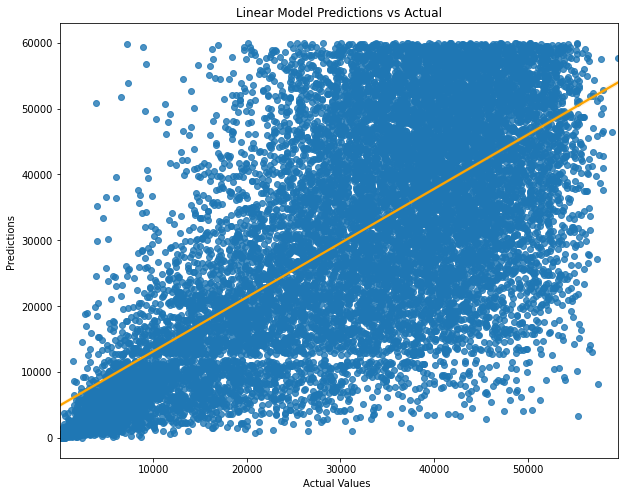

KNeighborsRegressor(n_jobs=10) R2 score: 0.4976758040144743
Mean Absolute Error: 9498.203492622173
Mean Squared Error: 12307.167029772943


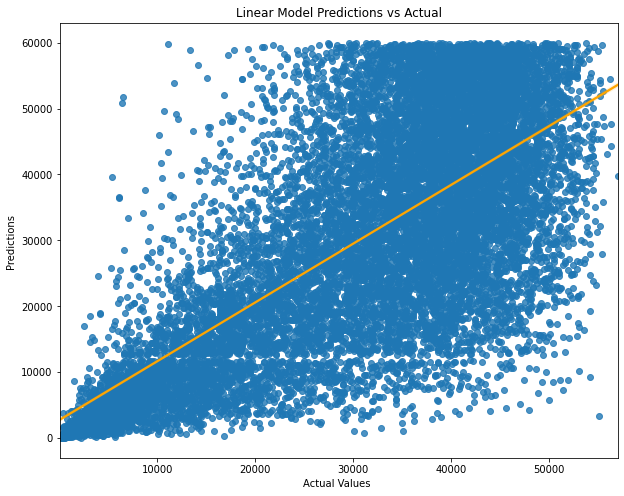

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.5131176653311973
Mean Absolute Error: 9397.721228412849
Mean Squared Error: 12116.5242164283


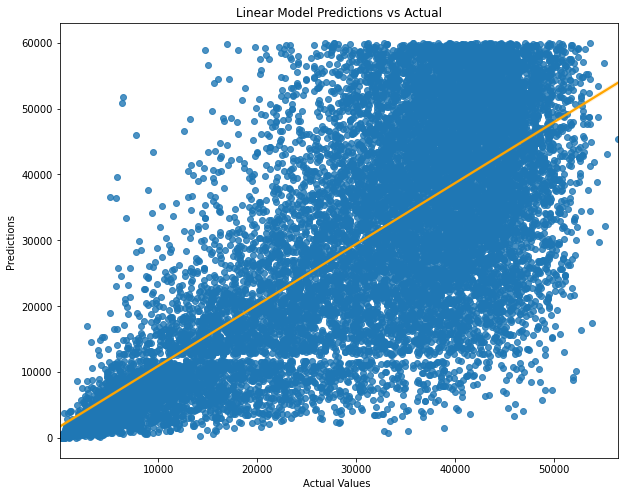

MLPRegressor(random_state=42) R2 score: 0.5100201422160016
Mean Absolute Error: 9830.508155940568
Mean Squared Error: 12155.00549550993


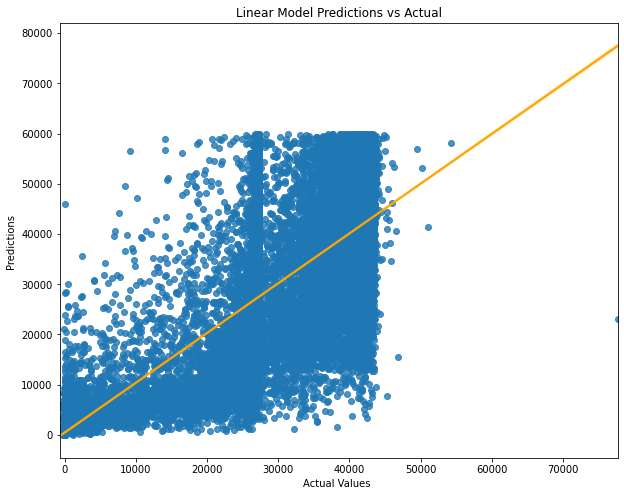

RandomForestRegressor() R2 score: 0.6704497843044639
Mean Absolute Error: 7543.118554020726
Mean Squared Error: 9968.431892900788


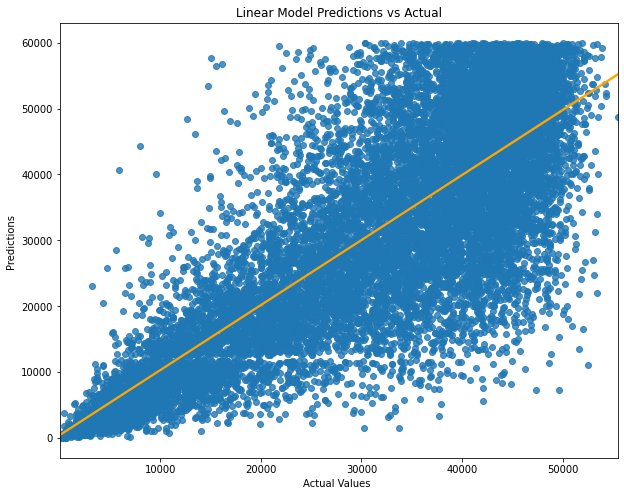

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.6832856504774898
Mean Absolute Error: 7424.489874367053
Mean Squared Error: 9772.37032339353


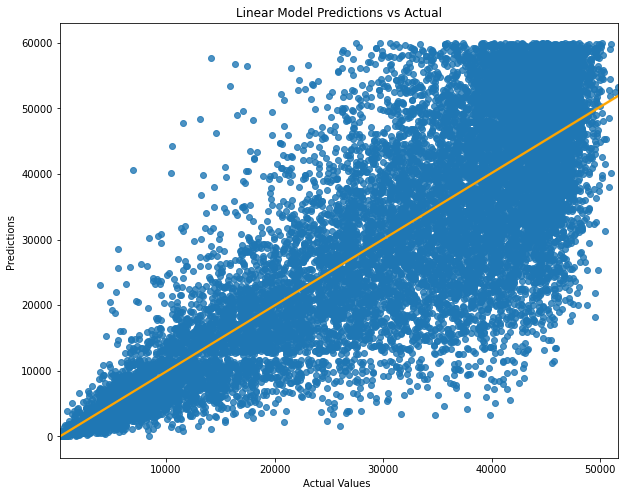

GradientBoostingRegressor(random_state=0) R2 score: 0.6704857843136143
Mean Absolute Error: 7657.395506295142
Mean Squared Error: 9967.887403133593


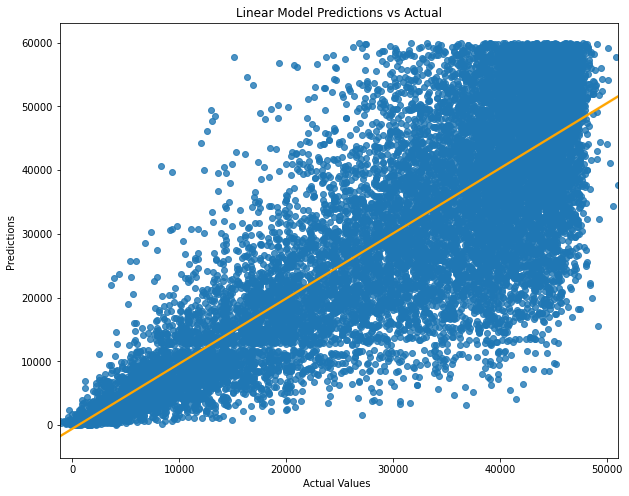

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6336748635854235
Mean Absolute Error: 7917.495837225511
Mean Squared Error: 10509.919894194541


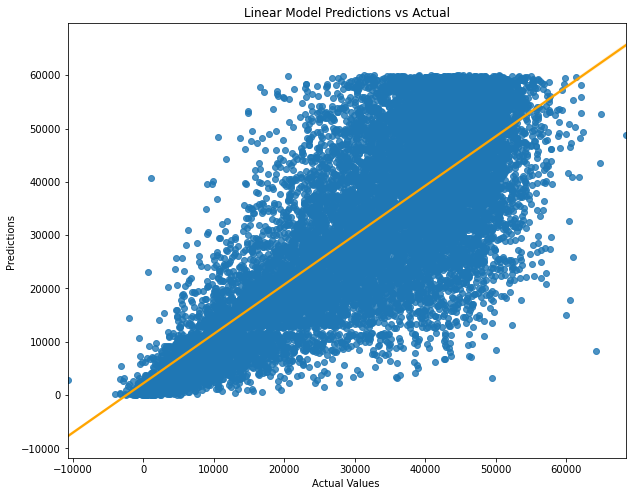

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6751216603170558
Mean Absolute Error: 7503.349854422693
Mean Squared Error: 9897.520828775629


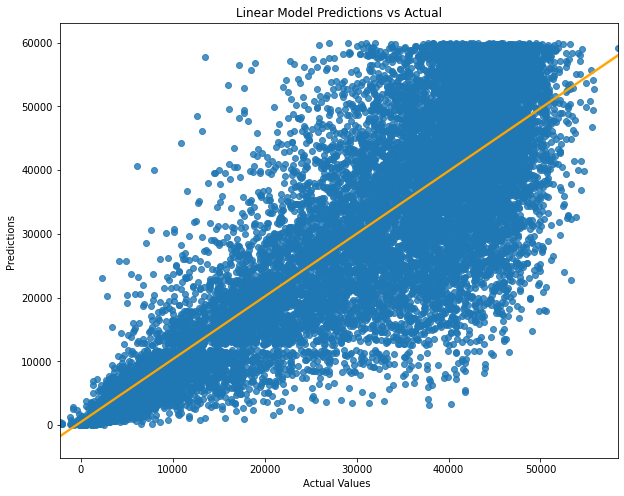

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6799306944825972
Mean Absolute Error: 7433.488454189081
Mean Squared Error: 9823.993345981653


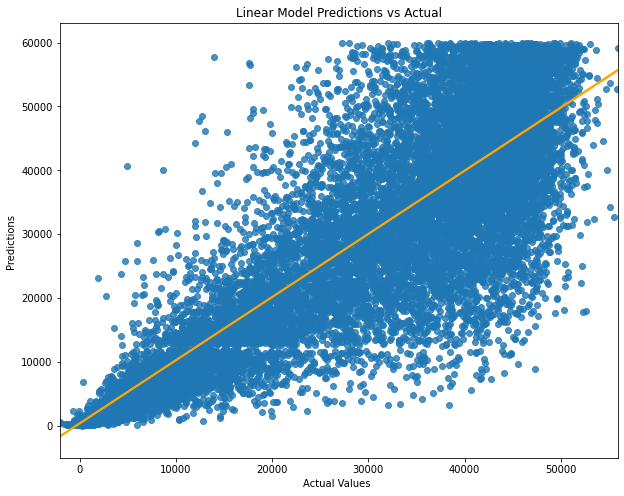

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.6832856504774898
Best Mean Absolute Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 7424.489874367053
Best Mean Squared Error: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 9772.37032339353


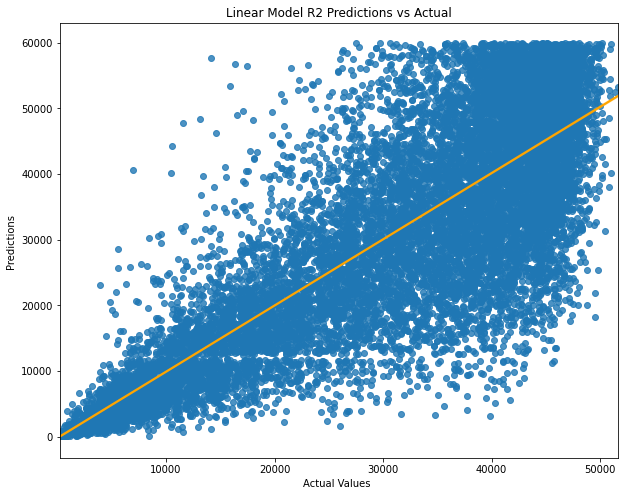

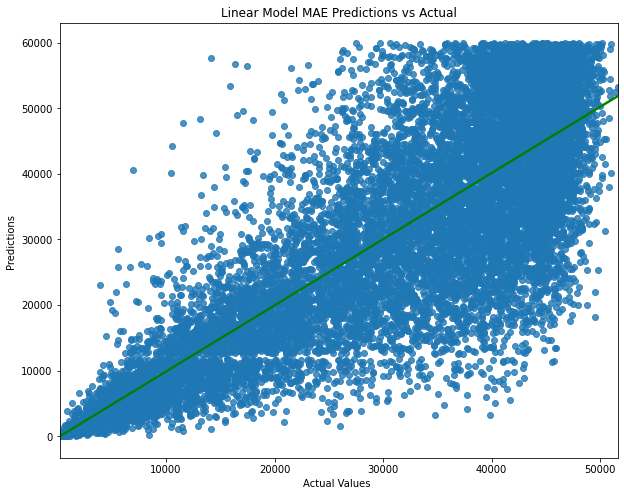

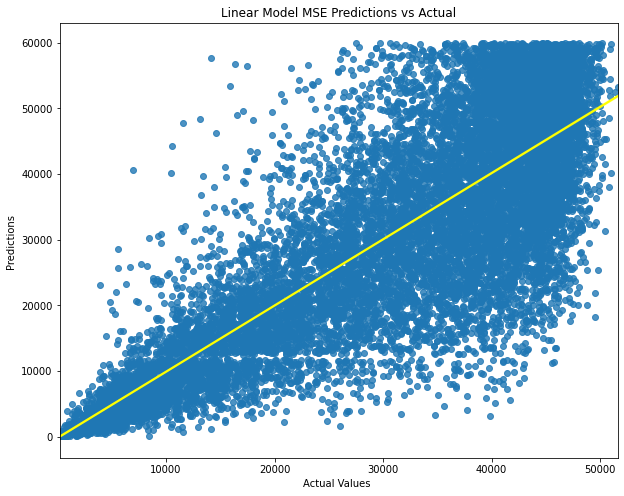

(RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [49]:
work_smart2(df2, 'Pornhub_rank', cols_to_keep, model_list)

In [50]:
df2[cols_to_keep].head()

,Subscribers,Videos_views,Uploaded_by_actor,Paid_videos,Fan_club_material,Verified_member,Age,Height,Weight,Joined,Profile Views,Videos Watched,Pornstar_or_model
Name,,,,,,,,,,,,,
Lana Rhoades,14000000,903120820,26.0,6.0,0.0,0,24,165,52,3,192086347,51,1.0
Abella Danger,868000,862007676,3.0,0.0,0.0,0,19,163,59,1,102153809,17,1.0
Riley Reid,15000000,1074883174,157.0,4.0,0.0,0,29,163,49,4,111081874,111,1.0
Eva Elfie,12000000,466905043,22.0,20.0,0.0,0,20,163,45,2,91253351,226,1.0
Mia Malkova,11000000,623234336,90.0,11.0,0.0,0,28,173,54,2,73577523,779,1.0


In [51]:
df2['Hair Color'].value_counts()

Other                    41693
Brunette                  6298
Black                     5515
Blonde                    3726
Red                       1257
Bald                       232
Grey                       179
Auburn                     141
Blonde|Brunette             22
Brunette|Black               9
Blonde|Black                 5
Blonde|Red|Brunette          3
Red|Black                    3
Blonde|Brunette|Black        3
Brunette|Bald                2
Blonde|Red                   2
Red|Brunette                 2
Brunette|Various             1
Black|Grey|Other             1
Various                      1
Red|Brunette|Black           1
Name: Hair Color, dtype: int64

In [52]:
df2['Hair Color'] = df2['Hair Color'].apply((lambda x: 1 if x == "Brunette" else 2 if x == "Black" else 3 if x == "Blonde" else 4 if x == "Red" else 0))

In [53]:
df2['Interested in'].value_counts()

Guys and Girls    27622
-                 16870
Girls             10010
Guys               4594
Name: Interested in, dtype: int64

In [54]:
df2['Interested in'] = df2['Interested in'].apply(lambda x: 1 if x == "Guys and Girls" else 2 if x == "Girls" else 3 if x == "Guys" else 0)

In [55]:
df2['Measurements'] = df2['Measurements'].apply(lambda x: 1 if (x.startswith("3") and int(x[:2]) < 34) else 2 if (x.startswith("3") and int(x[:2]) < 36) else 3 if x.startswith("4") else 0 )

In [56]:
df2['Measurements'].value_counts()

0    54781
2     1777
1     1695
3      843
Name: Measurements, dtype: int64

In [57]:
df2['Gender'] = df2['Gender'].apply(lambda x: 1 if (x == "-" or x == "Female") else 2 if x == "Male" else 3 if x == "Couple" else 0)

In [58]:
df2['Gender'].value_counts()

1    37722
3    10051
2     9743
0     1580
Name: Gender, dtype: int64

In [59]:
df2['Facial Hair'].value_counts()

-      55483
Yes     2344
No      1269
Name: Facial Hair, dtype: int64

In [60]:
df2['Facial Hair'] = df2['Facial Hair'].apply(lambda x: 1 if x == "Yes" else 0)

In [61]:
df2['Relationship status'].value_counts()

Single    21443
Taken     15370
-         14252
Open       8031
Name: Relationship status, dtype: int64

In [62]:
df2['Relationship status'] = df2['Relationship status'].apply(lambda x: 1 if x == "Single" else 2 if x == "Taken" else 0)

In [63]:
df2['Endowment'].value_counts()

-           55702
7-9"         1646
5-7"          971
9-10"         414
10"+          219
3-5"           93
Under 3"       51
Name: Endowment, dtype: int64

In [64]:
df2['Endowment'] = df2['Endowment'].apply(lambda x: 0 if x == "-" else 2 if x == '5-7"' else 3 if x == '7-9"' else 4 if x == '9-10"' else 5 if x == '10"+' else 1)

In [65]:
df2['Piercings'].value_counts()

Unknown    40626
Yes        10856
No          7614
Name: Piercings, dtype: int64

In [66]:
df2['Piercings'] = df2['Piercings'].apply(lambda x: 1 if x == "Yes" else 0)

In [67]:
df2['Tattoos'].value_counts()

No     45834
Yes    13262
Name: Tattoos, dtype: int64

In [68]:
df2['Tattoos'] = df2['Tattoos'].apply(lambda x: 1 if x == "Yes" else 0)

In [69]:
df2['Ethnicity'].value_counts()

-                       36839
White                   13368
Latin                    3056
Black                    2550
Other                    1610
Asian                    1309
Middle Eastern            240
Indian                    111
White|Asian                 6
Mixed                       2
Latin|Asian                 1
Black|Latin|Other           1
Black|Latin                 1
White|Other                 1
White|Middle Eastern        1
Name: Ethnicity, dtype: int64

In [70]:
df2['Ethnicity'] = df2['Ethnicity'].apply(lambda x: 1 if x == "White" else 2 if x == "Latin" else 3 if x == "Black" else 4 if x == "Asian" else 0)

In [71]:
dfcat = df2.select_dtypes(object)
remove_cols = []

for col in dfcat:
    remove_cols.append(col)
        
remove_cols

['Bio',
 'Background',
 'Birthday',
 'Birthplace',
 'Born',
 'Career Start and End',
 'City and Country',
 'Eye Color',
 'Foreskin',
 'Interests and hobbies',
 'Star Sign',
 'Turn Offs',
 'Turn Ons',
 'Video Views',
 'Hometown']

LinearRegression() R2 score: 0.29259148338116847
Mean Absolute Error: 12237.09907230866
Mean Squared Error: 14604.987442794338


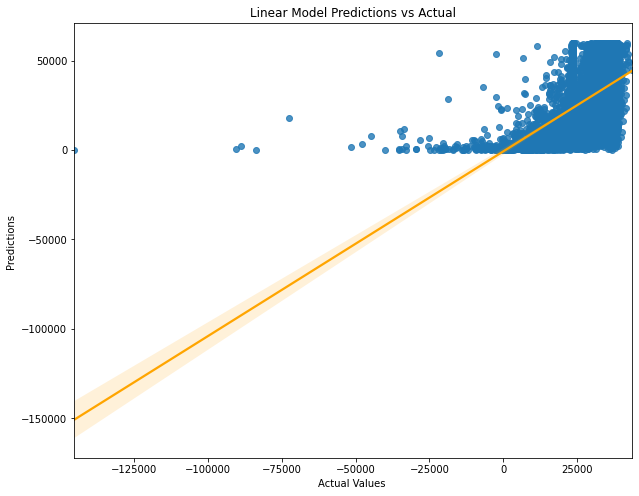

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.35828526783777215
Mean Absolute Error: 10752.014733089663
Mean Squared Error: 13910.317754777372


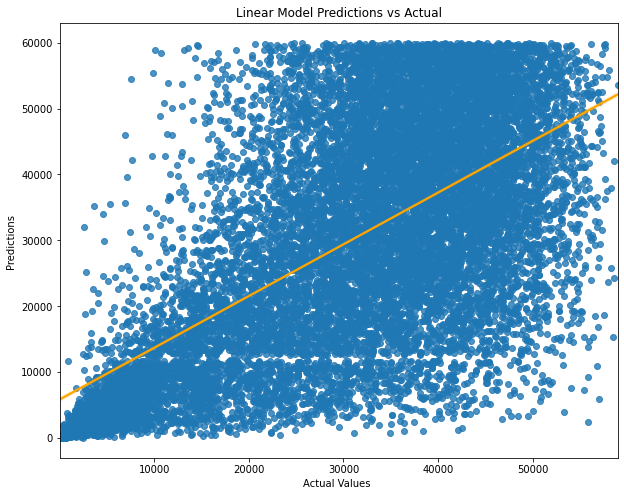

KNeighborsRegressor(n_jobs=10) R2 score: 0.41442541251690657
Mean Absolute Error: 10389.266454582374
Mean Squared Error: 13287.92464044498


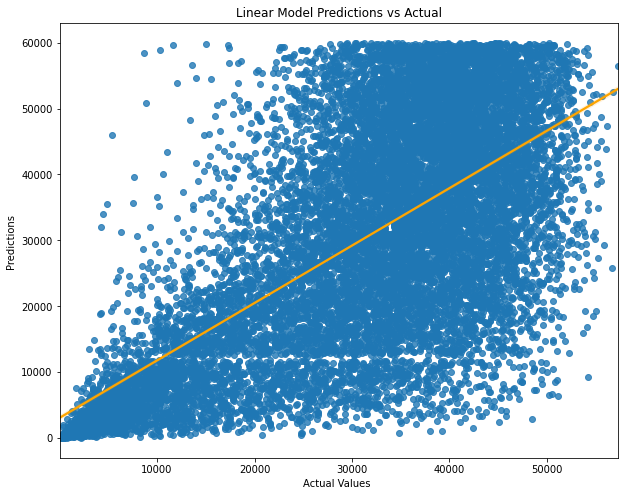

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.4378856393886402
Mean Absolute Error: 10252.772438066875
Mean Squared Error: 13019.022757703939


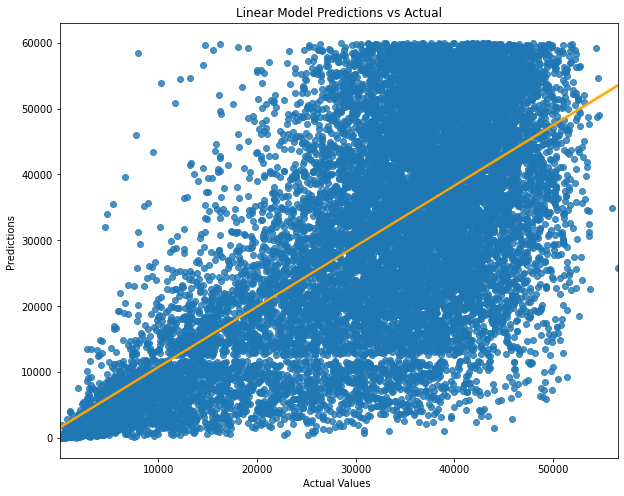

MLPRegressor(random_state=42) R2 score: 0.49948788337272876
Mean Absolute Error: 9963.051858540057
Mean Squared Error: 12284.948597453104


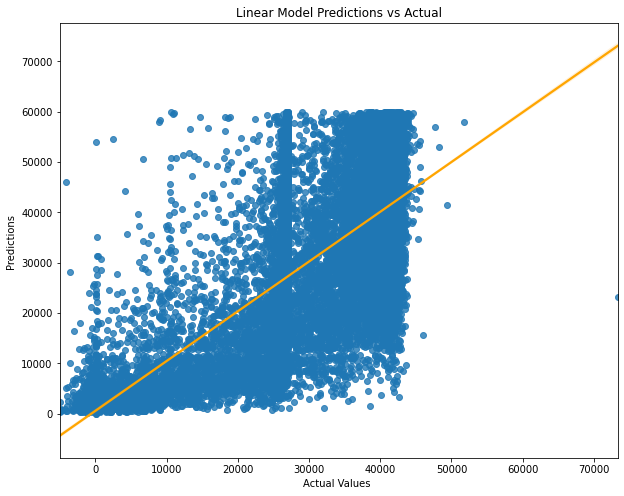

RandomForestRegressor() R2 score: 0.6742695838785755
Mean Absolute Error: 7501.42378473502
Mean Squared Error: 9910.491717862848


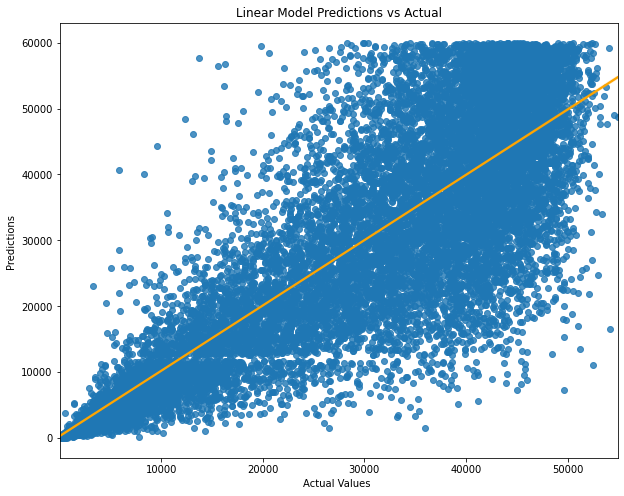

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.68533837187217
Mean Absolute Error: 7391.19612358771
Mean Squared Error: 9740.650000195892


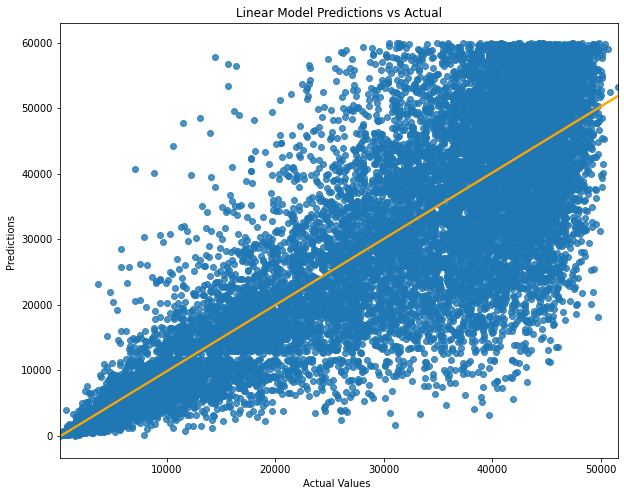

GradientBoostingRegressor(random_state=0) R2 score: 0.6694647559245798
Mean Absolute Error: 7675.029644252754
Mean Squared Error: 9983.318640634923


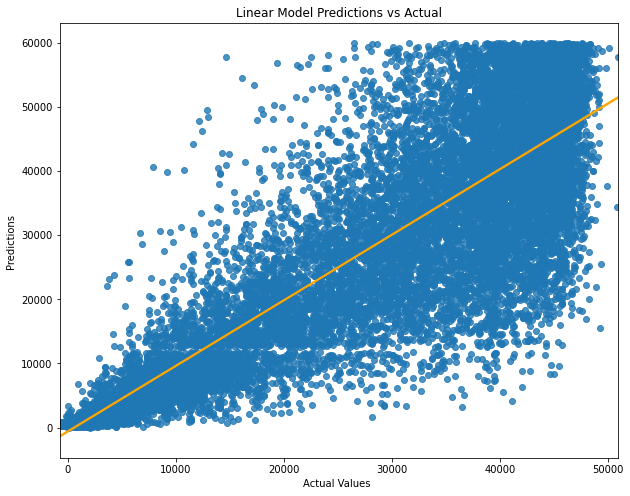

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.637834277814467
Mean Absolute Error: 7843.163576475319
Mean Squared Error: 10450.082463460143


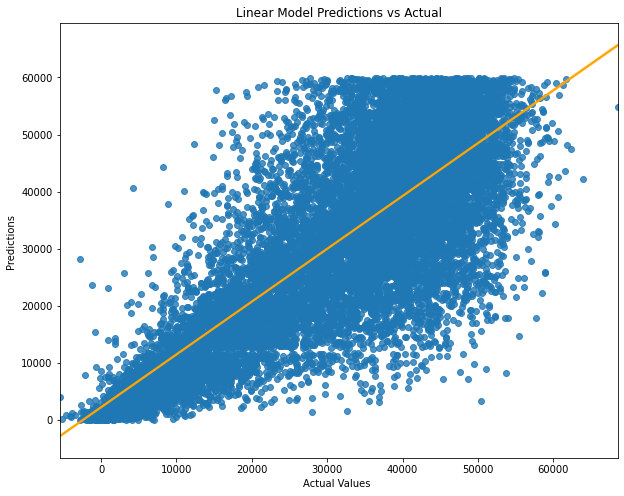

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6795880194025441
Mean Absolute Error: 7430.510361858645
Mean Squared Error: 9829.250859088777


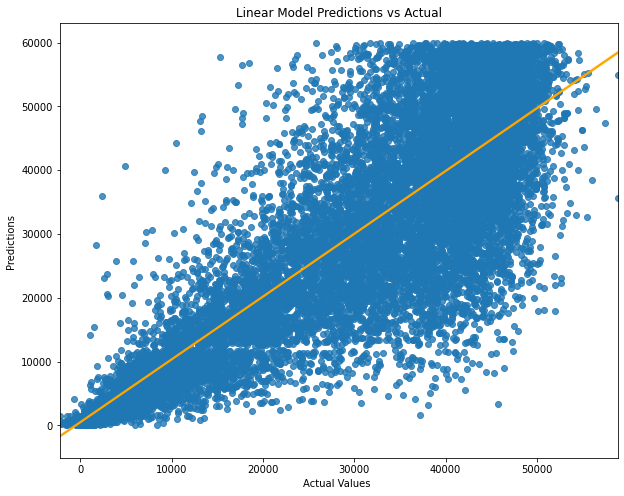

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.684555591897611
Mean Absolute Error: 7363.3944239043985
Mean Squared Error: 9752.75832378104


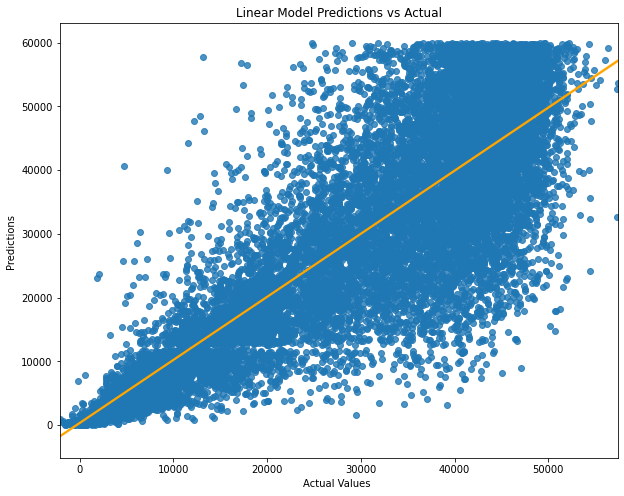

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.68533837187217
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 7363.3944239043985
Best Mean Squared Error: RandomForestReg

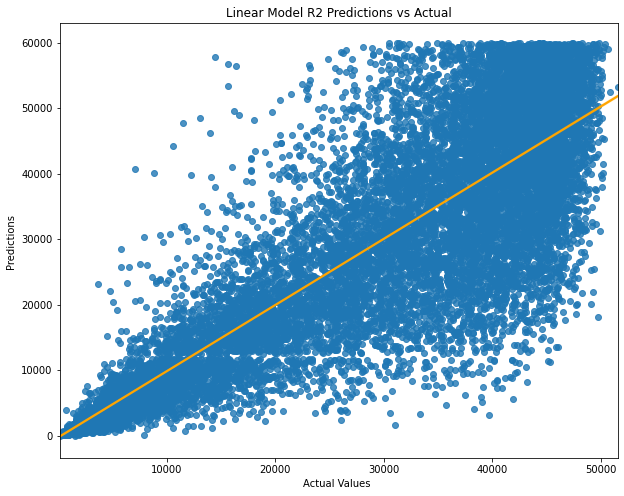

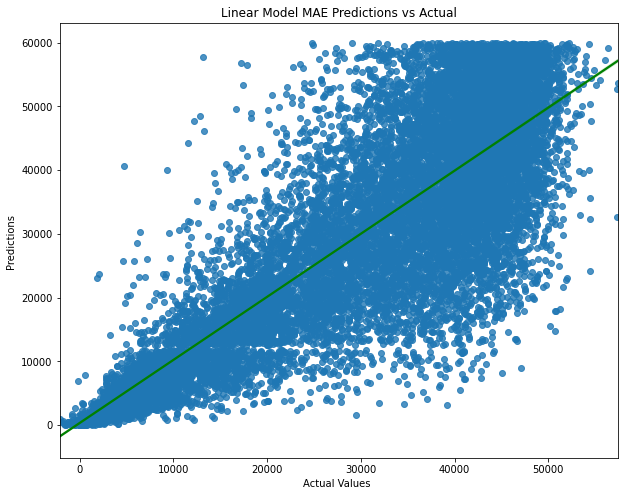

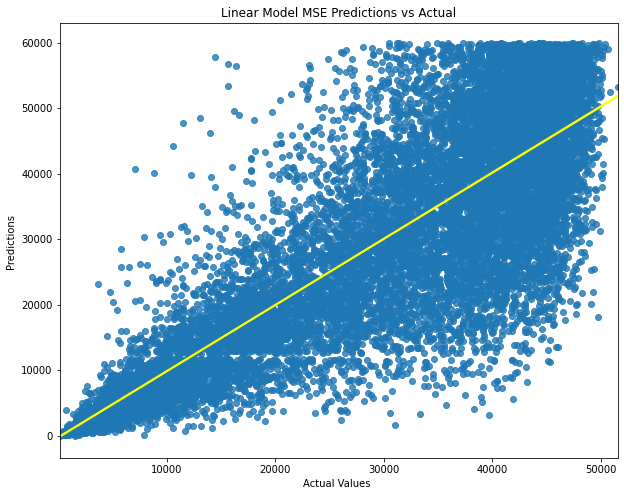

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [72]:
work_smart(df2, 'Pornhub_rank', model_list)

In [73]:
remove_cols.extend(['Pornhub_rank', "Model_rank", 'Pornstar_rank'])

In [74]:
from sklearn.feature_selection import RFE
from sklearn import linear_model
y = df2['Pornhub_rank']
X = df2.drop(columns=remove_cols, axis=1)
X = pd.get_dummies(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model = GradientBoostingRegressor(random_state=0)
rfe = RFE(model, n_features_to_select=20, verbose=False)
rfe.fit(X_train, y_train)
dt = pd.DataFrame(data = rfe.ranking_, columns=['Rank'])
dt['Column_name'] = X.columns
cols_to_keep = dt[dt['Rank']==1]['Column_name']
cols_to_keep

0                Subscribers
1               Videos_views
2          Uploaded_by_actor
3                Paid_videos
4          Fan_club_material
6            Verified_member
7               Premium_user
9                        Age
10             Career Status
11                 Endowment
15                    Gender
17                    Height
18                    Weight
19             Interested in
20                    Joined
23    Pornstar Profile Views
24             Profile Views
25       Relationship status
27            Videos Watched
28         Pornstar_or_model
Name: Column_name, dtype: object

In [75]:
df2.to_csv('ph_clean_2.csv')

In [76]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'auto'],
    'max_samples': [None, 0.5],
    'bootstrap': [True, False],
    'max_depth': [5, 10, 20, 50, None]
    }

model = RandomForestRegressor(random_state=42)

grid_search = GridSearchCV(model, param_grid, cv=5,
                           scoring='neg_root_mean_squared_error',
                           return_train_score=True, n_jobs=-1)

grid_search.fit(X_train,y_train)
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 10,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 100}

LinearRegression() R2 score: 0.2949793087278084
Mean Absolute Error: 12191.524861424734
Mean Squared Error: 14580.31737084018


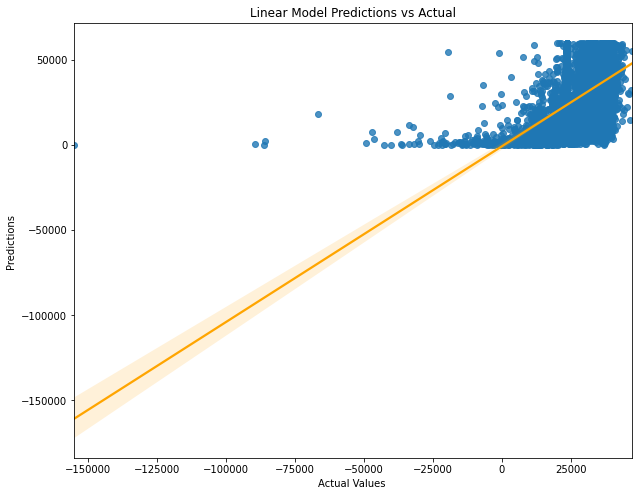

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.39139777688601785
Mean Absolute Error: 10442.180068588963
Mean Squared Error: 13546.678162120255


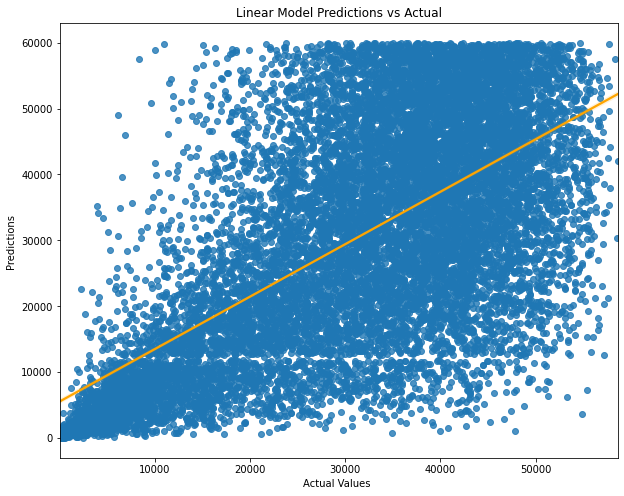

KNeighborsRegressor(n_jobs=10) R2 score: 0.44322601085369495
Mean Absolute Error: 10066.388940029783
Mean Squared Error: 12957.03151028607


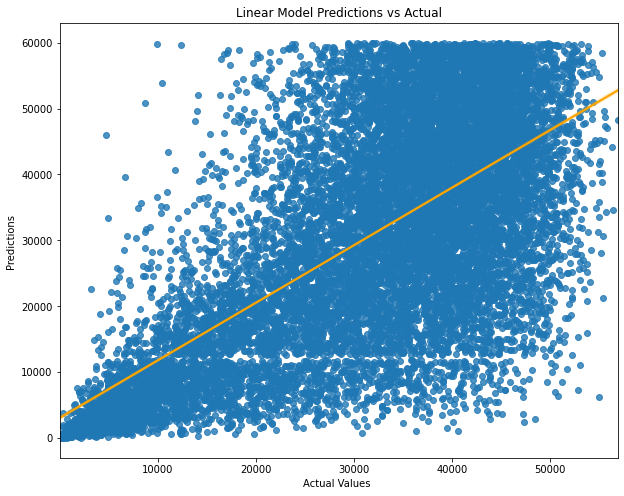

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.45897222905058255
Mean Absolute Error: 9975.604188825928
Mean Squared Error: 12772.497456900373


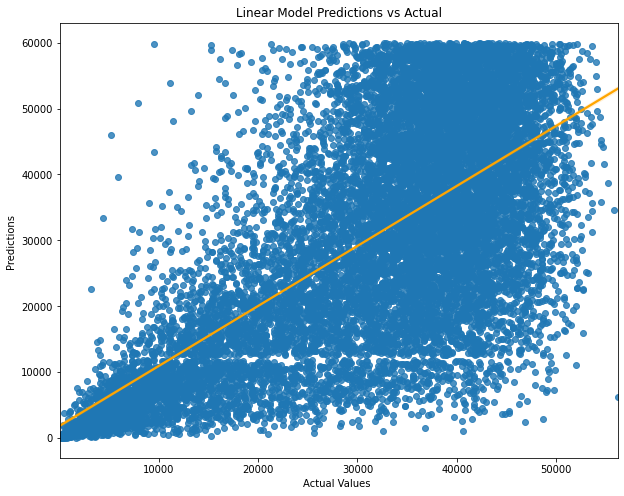

MLPRegressor(random_state=42) R2 score: 0.5073676479073204
Mean Absolute Error: 9876.703943493414
Mean Squared Error: 12187.861505824812


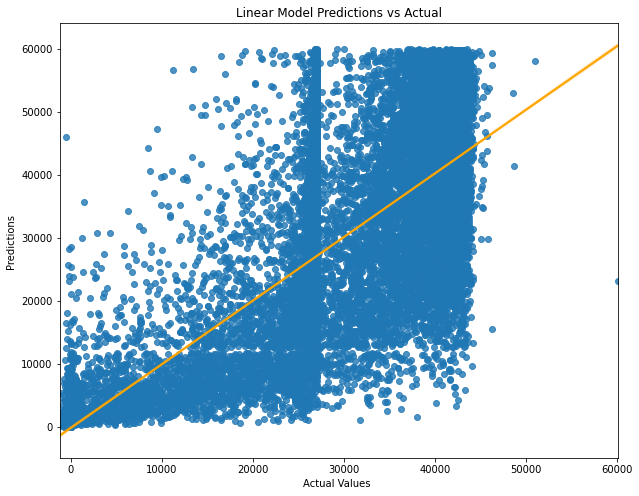

RandomForestRegressor() R2 score: 0.673784805425353
Mean Absolute Error: 7497.751464905515
Mean Squared Error: 9917.863775191621


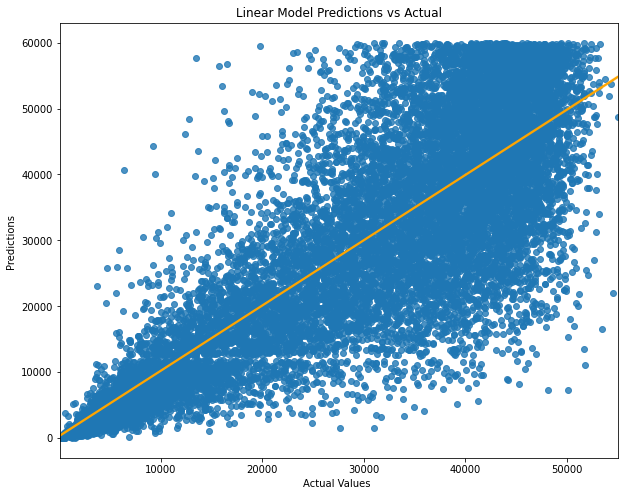

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.6848765791590792
Mean Absolute Error: 7399.040162266211
Mean Squared Error: 9747.794996026732


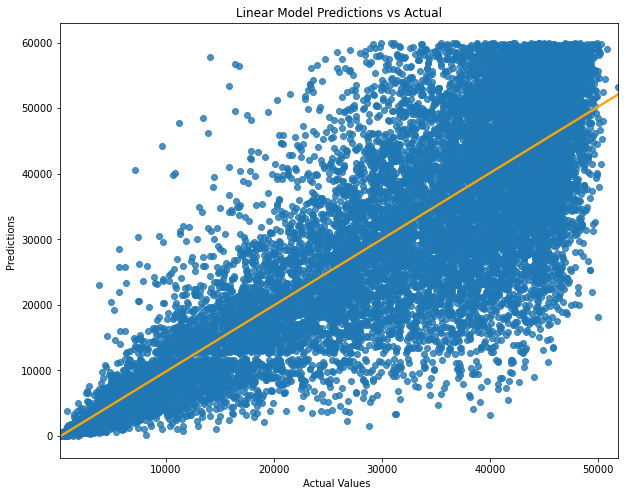

GradientBoostingRegressor(random_state=0) R2 score: 0.6696694484582499
Mean Absolute Error: 7672.126828624882
Mean Squared Error: 9980.226947243822


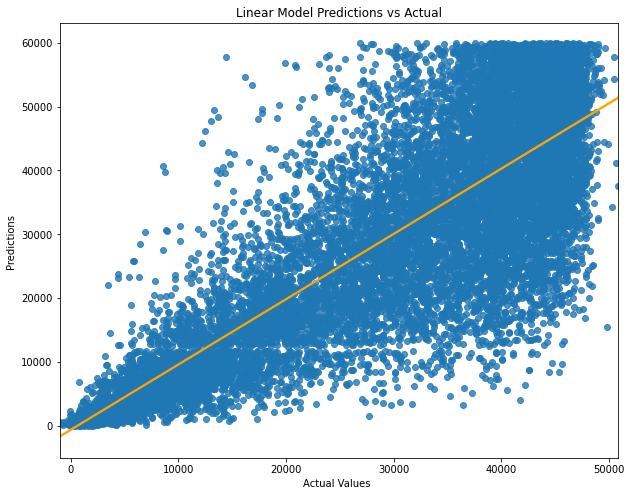

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6430734650447839
Mean Absolute Error: 7788.7111003252685
Mean Squared Error: 10374.220244347458


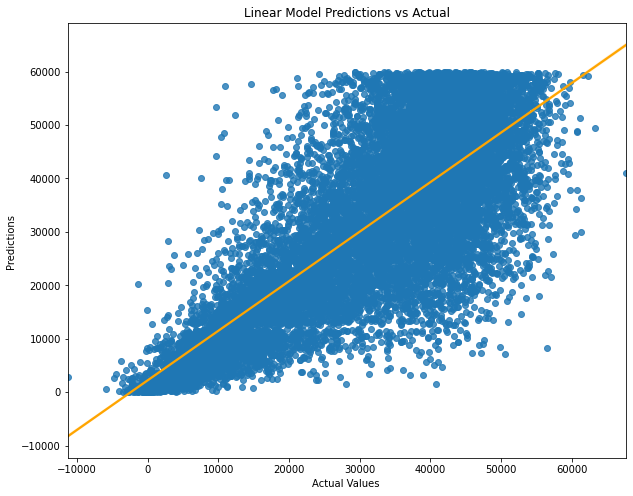

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6808622586192516
Mean Absolute Error: 7413.316947750137
Mean Squared Error: 9809.686524867322


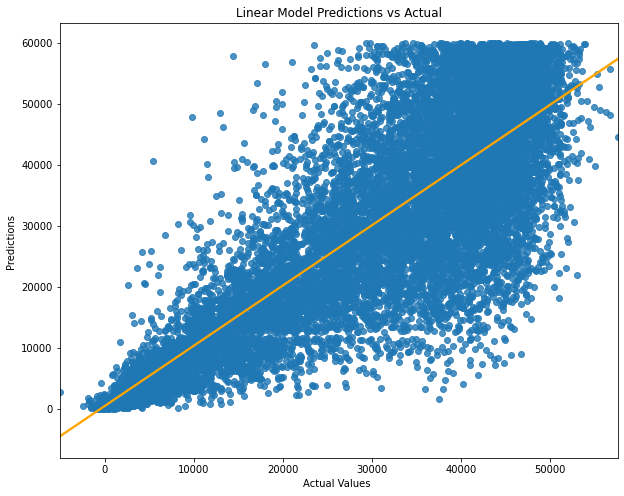

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6824893759041812
Mean Absolute Error: 7392.28059367593
Mean Squared Error: 9784.647324984264


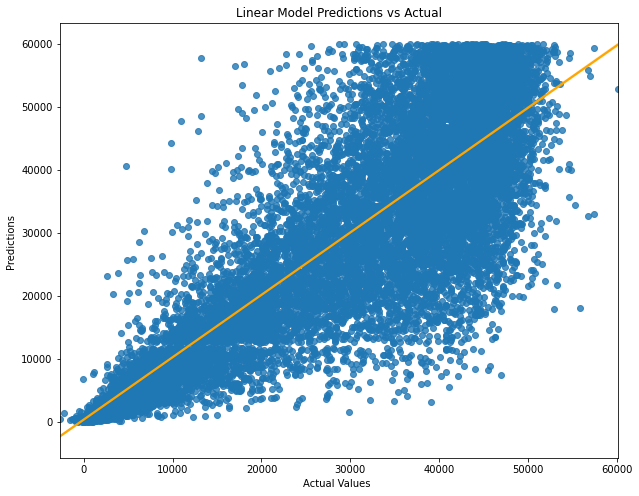

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) 0.6848765791590792
Best Mean Absolute Error: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 7392.28059367593
Best Mean Squared Error: RandomForestReg

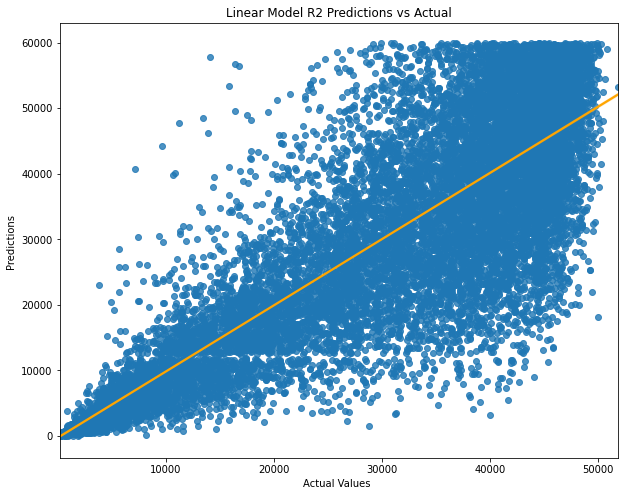

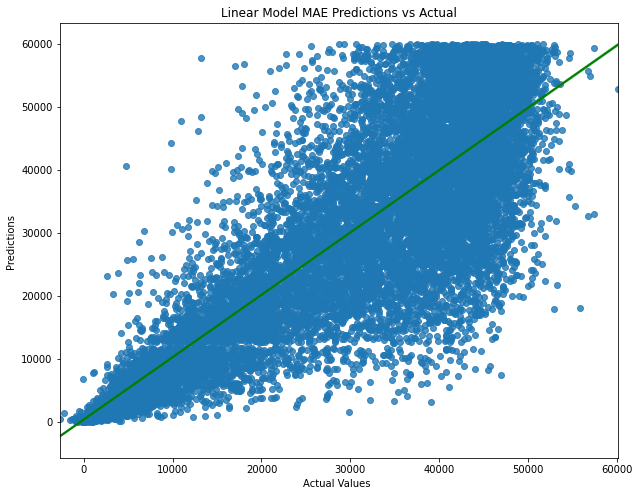

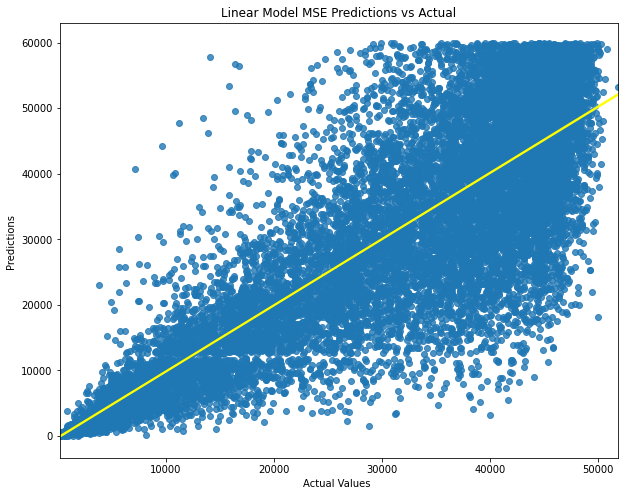

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2),
 RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2))

In [77]:
work_smart2(df2, 'Pornhub_rank', cols_to_keep, model_list)

In [78]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100],
    'min_samples_split': [2, 4],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', 'auto'],
    'max_samples': [None, 0.5],
    'bootstrap': [True, False],
    'max_depth': [5, 10, 20, 50, None]
    }

model = XGBRegressor()

grid_search = GridSearchCV(model, param_grid, cv=5,
                           scoring='neg_root_mean_squared_error',
                           return_train_score=True, n_jobs=-1)

grid_search.fit(X_train,y_train)
grid_search.best_params_

[21:13:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { bootstrap, max_features, min_samples_leaf, min_samples_split } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




{'bootstrap': True,
 'max_depth': 5,
 'max_features': 'sqrt',
 'max_samples': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

LinearRegression() R2 score: 0.2949793087278084
Mean Absolute Error: 12191.524861424734
Mean Squared Error: 14580.31737084018


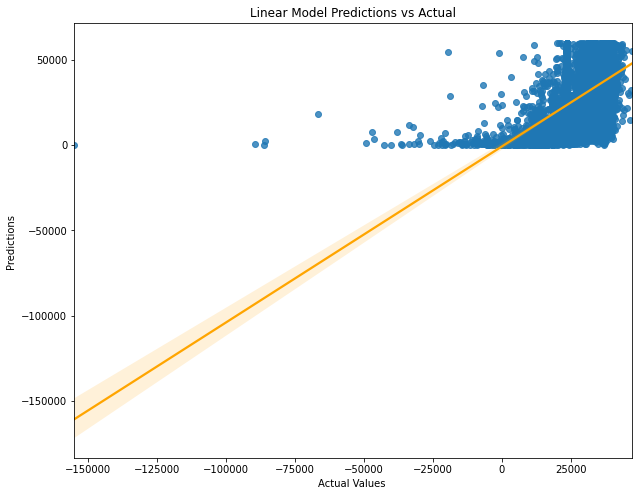

KNeighborsRegressor(n_jobs=10, n_neighbors=3) R2 score: 0.39139777688601785
Mean Absolute Error: 10442.180068588963
Mean Squared Error: 13546.678162120255


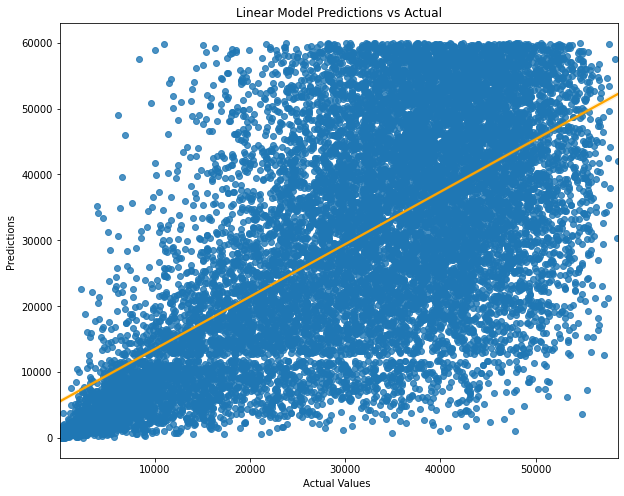

KNeighborsRegressor(n_jobs=10) R2 score: 0.44322601085369495
Mean Absolute Error: 10066.388940029783
Mean Squared Error: 12957.03151028607


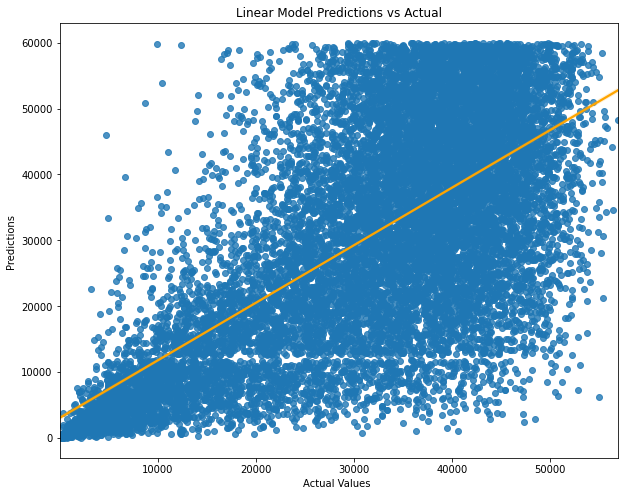

KNeighborsRegressor(n_jobs=10, n_neighbors=7) R2 score: 0.45897222905058255
Mean Absolute Error: 9975.604188825928
Mean Squared Error: 12772.497456900373


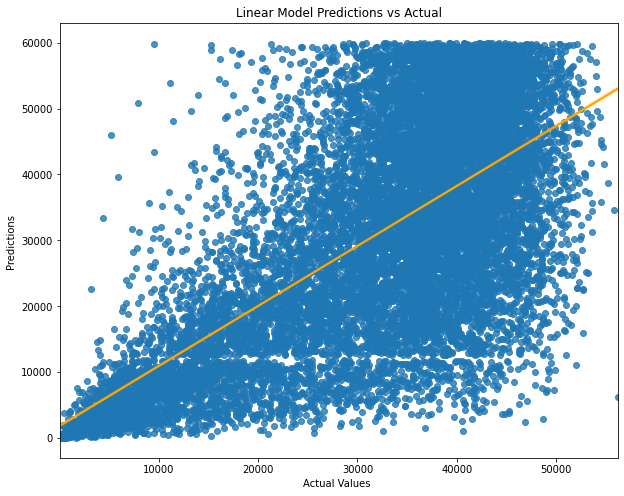

MLPRegressor(random_state=42) R2 score: 0.5073676479073204
Mean Absolute Error: 9876.703943493414
Mean Squared Error: 12187.861505824812


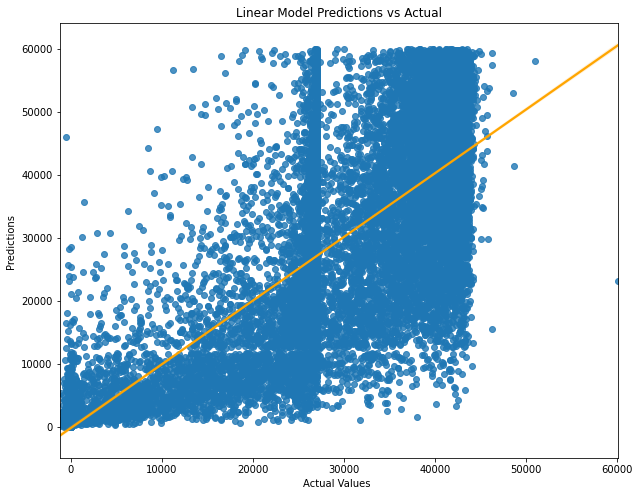

RandomForestRegressor() R2 score: 0.6739144337413079
Mean Absolute Error: 7496.671698639962
Mean Squared Error: 9915.893045832157


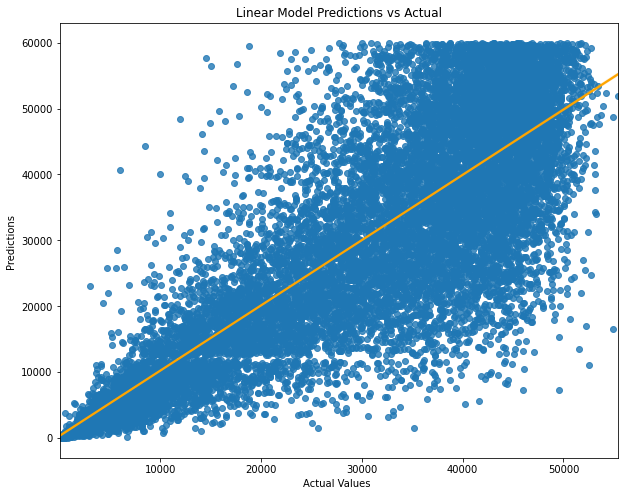

RandomForestRegressor(max_depth=10, max_samples=0.5, min_samples_leaf=2) R2 score: 0.6848047927843315
Mean Absolute Error: 7398.667968196787
Mean Squared Error: 9748.90522613158


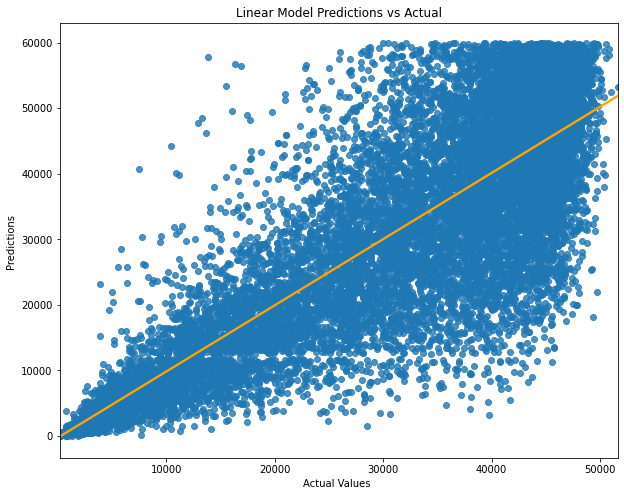

GradientBoostingRegressor(random_state=0) R2 score: 0.6696694484582499
Mean Absolute Error: 7672.126828624882
Mean Squared Error: 9980.226947243822


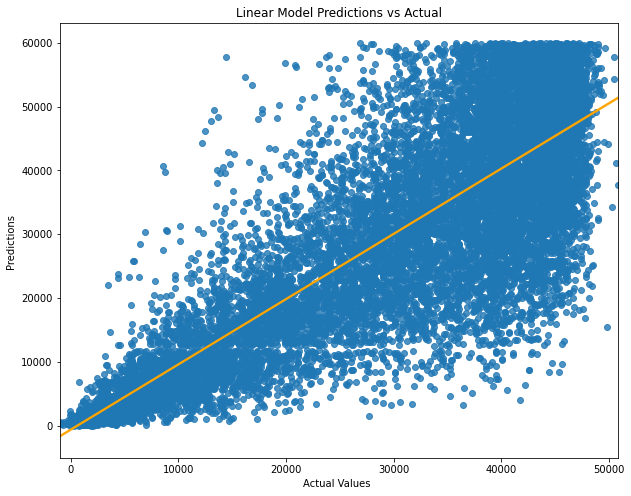

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6430734650447839
Mean Absolute Error: 7788.7111003252685
Mean Squared Error: 10374.220244347458


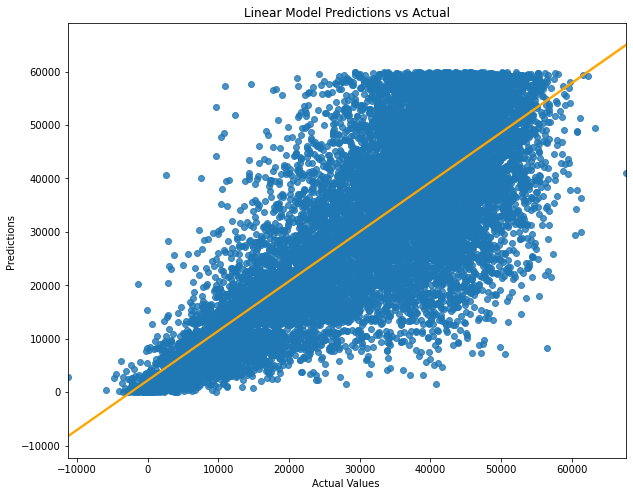

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6808622586192516
Mean Absolute Error: 7413.316947750137
Mean Squared Error: 9809.686524867322


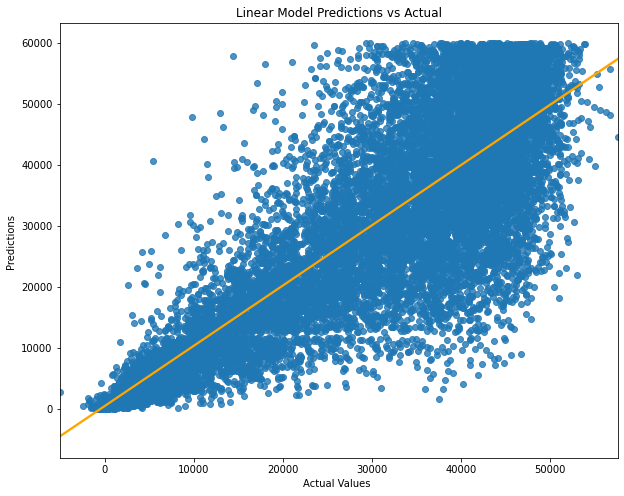

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) R2 score: 0.6824893759041812
Mean Absolute Error: 7392.28059367593
Mean Squared Error: 9784.647324984264


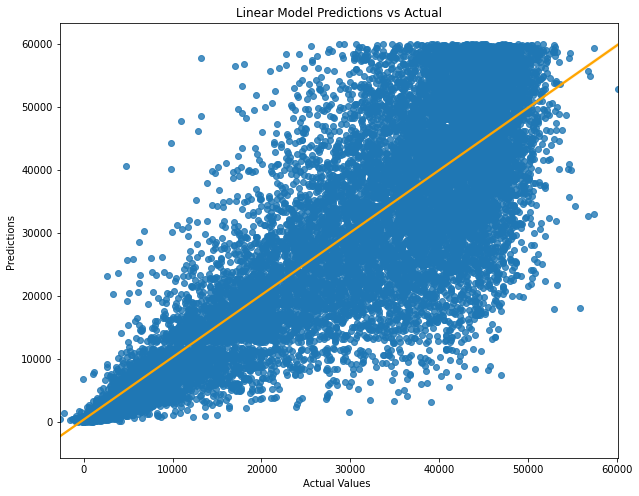

[21:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { bootstrap, max_features, min_samples_leaf, min_samples_split } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


XGBRegressor(base_score=0.5, booster='gbtree', bootstrap=True,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             gamma=0, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=5, max_features='sqrt',
             max_samples=None, min_child_weight=1, min_samples_leaf=1,
             min_samples_split=2, missing=nan, monotone_constraints='()',
             n_estimators=50, n_jobs=16, num_parallel_tree=1, random_state=0,
            

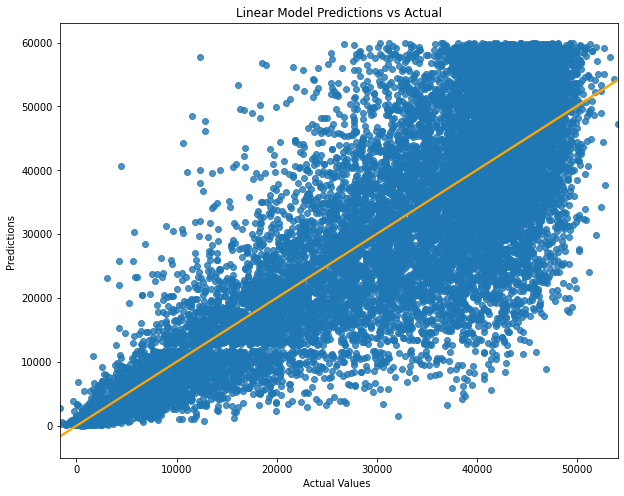

--------------------------------------------------------------------------------------------------------
TAA DAAA!! AND THE WINNER IIIISSSSS:
--------------------------------------------------------------------------------------------------------
Best R2: XGBRegressor(base_score=0.5, booster='gbtree', bootstrap=True,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             gamma=0, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=5, max_features='sqrt',
             max_samples=None, min_child_weight=1, min_samples_leaf=1,
             min_samples_split=2, missing=nan, monotone_constraints='()',
             n_estimators=50, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, ...) 0.6849843980161469
Best Mean Absolute Error: XGBRegressor(b

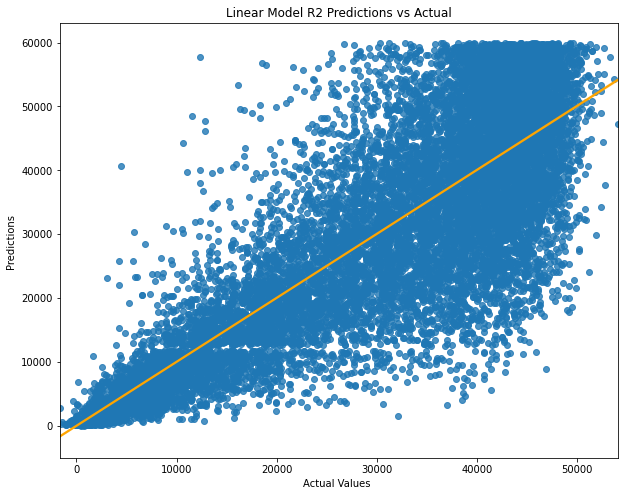

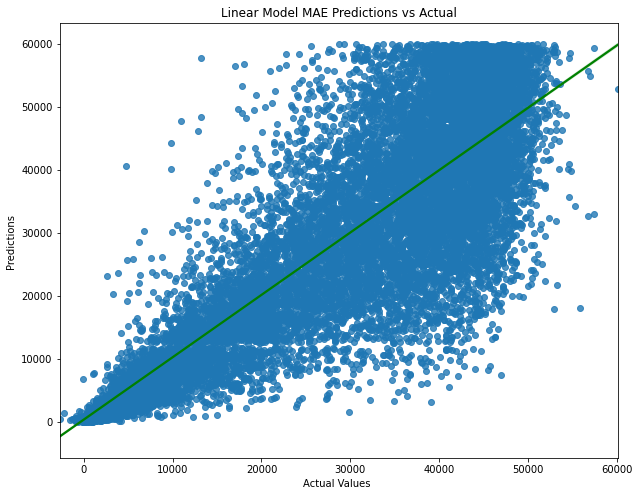

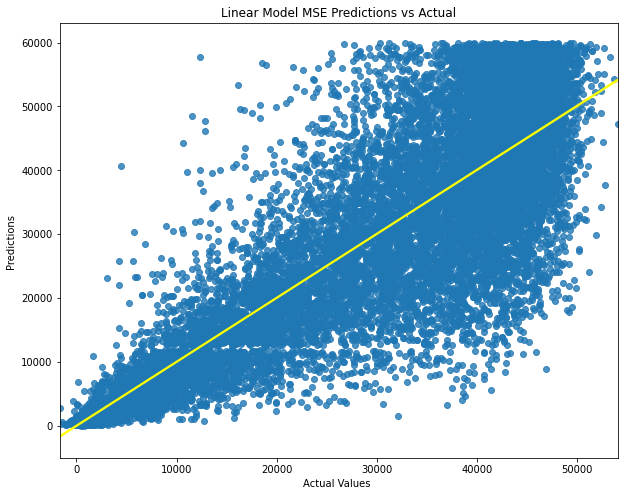

(XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=16, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None),
 XGBRegressor(base_score=0.5, booster='gbtree', bootstrap=True,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=5, max_features='sqrt',
              max_samples=None, min_child_weight=1, min_samples_leaf=1,
              min_

In [80]:
work_smart2(df2, 'Pornhub_rank', cols_to_keep, model_list)